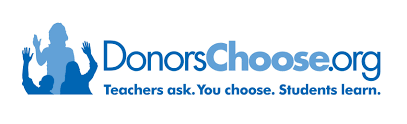

# Introduction

Donorschoose.org is a US-based non-profit organization that allows individuals to donate directly to public school classroom projects.Founded in 2000 by former public school teacher Charles Best, DonorsChoose.org was among the first civic crowdfunding platforms of its kind. The organization has been given Charity Navigator’s highest rating every year since 2005.In January 2018, they announced that 1 million projects had been funded.To get students what they need to learn, the team at DonorsChoose.org needs to be able to connect donors with the projects that most inspire them.

## Problem Statement

<p>
DonorsChoose.org receives hundreds of thousands of project proposals each year for classroom projects in need of funding. Right now, a large number of volunteers is needed to manually screen each submission before it's approved to be posted on the DonorsChoose.org website.
</p>
<p>
    Next year, DonorsChoose.org expects to receive close to 500,000 project proposals. As a result, there are three main problems they need to solve:
<ul>
<li>
    How to scale current manual processes and resources to screen 500,000 projects so that they can be posted as quickly and as efficiently as possible</li>
    <li>How to increase the consistency of project vetting across different volunteers to improve the experience for teachers</li>
    <li>How to focus volunteer time on the applications that need the most assistance</li>
    </ul>
</p>    
<p>
The goal of the assignment is to predict whether or not a DonorsChoose.org project proposal submitted by a teacher will be approved, using the text of project descriptions as well as additional metadata about the project, teacher, and school. DonorsChoose.org can then use this information to identify projects most likely to need further review before approval.
</p>


# Importing Libraries

In [1]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os

from plotly import plotly
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
from collections import Counter

C:\Users\aksha\Anaconda3\lib\site-packages\smart_open\ssh.py:34: UserWarning: paramiko missing, opening SSH/SCP/SFTP paths will be disabled.  `pip install paramiko` to suppress
  warnings.warn('paramiko missing, opening SSH/SCP/SFTP paths will be disabled.  `pip install paramiko` to suppress')
C:\Users\aksha\Anaconda3\lib\site-packages\gensim\utils.py:1197: UserWarning: detected Windows; aliasing chunkize to chunkize_serial
  warnings.warn("detected Windows; aliasing chunkize to chunkize_serial")


# Directory List

In [2]:
os.chdir("D:\\applied AI\\Donorchoose")

# About the dataset

The train_data.csv is the dataset provided by the DonorsChoose containin features as follows :-


Feature | Description 
----------|---------------
**`project_id`** | A unique identifier for the proposed project. **Example:** `p036502`   
**`project_title`**    | Title of the project. **Examples:**<br><ul><li><code>Art Will Make You Happy!</code></li><li><code>First Grade Fun</code></li></ul> 
**`project_grade_category`** | Grade level of students for which the project is targeted. One of the following enumerated values: <br/><ul><li><code>Grades PreK-2</code></li><li><code>Grades 3-5</code></li><li><code>Grades 6-8</code></li><li><code>Grades 9-12</code></li></ul>  
 **`project_subject_categories`** | One or more (comma-separated) subject categories for the project from the following enumerated list of values:  <br/><ul><li><code>Applied Learning</code></li><li><code>Care &amp; Hunger</code></li><li><code>Health &amp; Sports</code></li><li><code>History &amp; Civics</code></li><li><code>Literacy &amp; Language</code></li><li><code>Math &amp; Science</code></li><li><code>Music &amp; The Arts</code></li><li><code>Special Needs</code></li><li><code>Warmth</code></li></ul><br/> **Examples:** <br/><ul><li><code>Music &amp; The Arts</code></li><li><code>Literacy &amp; Language, Math &amp; Science</code></li>  
  **`school_state`** | State where school is located ([Two-letter U.S. postal code](https://en.wikipedia.org/wiki/List_of_U.S._state_abbreviations#Postal_codes)). **Example:** `WY`
**`project_subject_subcategories`** | One or more (comma-separated) subject subcategories for the project. **Examples:** <br/><ul><li><code>Literacy</code></li><li><code>Literature &amp; Writing, Social Sciences</code></li></ul> 
**`project_resource_summary`** | An explanation of the resources needed for the project. **Example:** <br/><ul><li><code>My students need hands on literacy materials to manage sensory needs!</code</li></ul> 
**`project_essay_1`**    | First application essay<sup>*</sup>  
**`project_essay_2`**    | Second application essay<sup>*</sup> 
**`project_essay_3`**    | Third application essay<sup>*</sup> 
**`project_essay_4`**    | Fourth application essay<sup>*</sup> 
**`project_submitted_datetime`** | Datetime when project application was submitted. **Example:** `2016-04-28 12:43:56.245`   
**`teacher_id`** | A unique identifier for the teacher of the proposed project. **Example:** `bdf8baa8fedef6bfeec7ae4ff1c15c56`  
**`teacher_prefix`** | Teacher's title. One of the following enumerated values: <br/><ul><li><code>nan</code></li><li><code>Dr.</code></li><li><code>Mr.</code></li><li><code>Mrs.</code></li><li><code>Ms.</code></li><li><code>Teacher.</code></li></ul>  
**`teacher_number_of_previously_posted_projects`** | Number of project applications previously submitted by the same teacher. **Example:** `2` 

<sup>*</sup> See the section <b>Notes on the Essay Data</b> for more details about these features.

Additionally, the `resources.csv` data set provides more data about the resources required for each project. Each line in this file represents a resource required by a project:

Feature | Description 
----------|---------------
**`id`** | A `project_id` value from the `train.csv` file.  **Example:** `p036502`   
**`description`** | Desciption of the resource. **Example:** `Tenor Saxophone Reeds, Box of 25`   
**`quantity`** | Quantity of the resource required. **Example:** `3`   
**`price`** | Price of the resource required. **Example:** `9.95`   

**Note:** Many projects require multiple resources. The `id` value corresponds to a `project_id` in train.csv, so you use it as a key to retrieve all resources needed for a project:

The data set contains the following label (the value you will attempt to predict):

Label | Description
----------|---------------
`project_is_approved` | A binary flag indicating whether DonorsChoose approved the project. A value of `0` indicates the project was not approved, and a value of `1` indicates the project was approved.

# Reading the data

In [3]:
train_data=pd.read_csv("train_data.csv")
res_data=pd.read_csv("resources.csv")

In [4]:
print("datapoints in train data=",train_data.shape)

datapoints in train data= (109248, 17)


In [5]:
print("column names",train_data.columns)

column names Index(['Unnamed: 0', 'id', 'teacher_id', 'teacher_prefix', 'school_state',
       'project_submitted_datetime', 'project_grade_category',
       'project_subject_categories', 'project_subject_subcategories',
       'project_title', 'project_essay_1', 'project_essay_2',
       'project_essay_3', 'project_essay_4', 'project_resource_summary',
       'teacher_number_of_previously_posted_projects', 'project_is_approved'],
      dtype='object')


In [6]:
print(train_data.head())

   Unnamed: 0       id                        teacher_id teacher_prefix  \
0      160221  p253737  c90749f5d961ff158d4b4d1e7dc665fc           Mrs.   
1      140945  p258326  897464ce9ddc600bced1151f324dd63a            Mr.   
2       21895  p182444  3465aaf82da834c0582ebd0ef8040ca0            Ms.   
3          45  p246581  f3cb9bffbba169bef1a77b243e620b60           Mrs.   
4      172407  p104768  be1f7507a41f8479dc06f047086a39ec           Mrs.   

  school_state project_submitted_datetime project_grade_category  \
0           IN        2016-12-05 13:43:57          Grades PreK-2   
1           FL        2016-10-25 09:22:10             Grades 6-8   
2           AZ        2016-08-31 12:03:56             Grades 6-8   
3           KY        2016-10-06 21:16:17          Grades PreK-2   
4           TX        2016-07-11 01:10:09          Grades PreK-2   

            project_subject_categories     project_subject_subcategories  \
0                  Literacy & Language                     ESL, 

In [7]:
# how to replace elements in list python: https://stackoverflow.com/a/2582163/4084039
# Replacing datetime columns to date column
cols = ['Date' if x=='project_submitted_datetime' else x for x in list(train_data.columns)] #if x encounters column name project_submitted_datetime it will replace by date 
#so a new column Date is created

#sort dataframe based on time pandas python: https://stackoverflow.com/a/49702492/40-84039
train_data['Date'] = pd.to_datetime(train_data['project_submitted_datetime']) #pd.to_datetime converts argument to datetime
train_data.drop('project_submitted_datetime', axis=1, inplace=True) #dropping the column project_submitted_date
train_data.sort_values(by=['Date'], inplace=True)#sorting the dataframe by date


# how to reorder columns pandas python: https://stackoverflow.com/a/13148611/4084039
train_data = train_data[cols] #adding the new column


train_data.head(2) #displaying the dataframe

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,Date,project_grade_category,project_subject_categories,project_subject_subcategories,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved
55660,8393,p205479,2bf07ba08945e5d8b2a3f269b2b3cfe5,Mrs.,CA,2016-04-27 00:27:36,Grades PreK-2,Math & Science,"Applied Sciences, Health & Life Science",Engineering STEAM into the Primary Classroom,I have been fortunate enough to use the Fairy ...,My students come from a variety of backgrounds...,Each month I try to do several science or STEM...,It is challenging to develop high quality scie...,My students need STEM kits to learn critical s...,53,1
76127,37728,p043609,3f60494c61921b3b43ab61bdde2904df,Ms.,UT,2016-04-27 00:31:25,Grades 3-5,Special Needs,Special Needs,Sensory Tools for Focus,Imagine being 8-9 years old. You're in your th...,"Most of my students have autism, anxiety, anot...",It is tough to do more than one thing at a tim...,When my students are able to calm themselves d...,My students need Boogie Boards for quiet senso...,4,1


In [8]:
print("datapoints in resources=",res_data.shape) 

datapoints in resources= (1541272, 4)


In [9]:
print("attributes of resources=",res_data.columns)

attributes of resources= Index(['id', 'description', 'quantity', 'price'], dtype='object')


In [10]:
print(res_data.head(3))

        id                                        description  quantity  \
0  p233245  LC652 - Lakeshore Double-Space Mobile Drying Rack         1   
1  p069063        Bouncy Bands for Desks (Blue support pipes)         3   
2  p069063  Cory Stories: A Kid's Book About Living With Adhd         1   

    price  
0  149.00  
1   14.95  
2    8.45  


In [11]:
#Refer-> https://www.shanelynn.ie/summarising-aggregation-and-grouping-data-in-python-pandas/

price_data = res_data.groupby('id').agg({'price':'sum', 'quantity':'sum'}).reset_index() #grouping is done on the basis of ids and agggreating the sum of price and quantity column

#https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.merge.html?highlight=merge#pandas.merge
train_data = train_data.merge(price_data, on='id', how='left')
print(train_data.head(1))

   Unnamed: 0       id                        teacher_id teacher_prefix  \
0        8393  p205479  2bf07ba08945e5d8b2a3f269b2b3cfe5           Mrs.   

  school_state                Date project_grade_category  \
0           CA 2016-04-27 00:27:36          Grades PreK-2   

  project_subject_categories            project_subject_subcategories  \
0             Math & Science  Applied Sciences, Health & Life Science   

                                  project_title  \
0  Engineering STEAM into the Primary Classroom   

                                     project_essay_1  \
0  I have been fortunate enough to use the Fairy ...   

                                     project_essay_2  \
0  My students come from a variety of backgrounds...   

                                     project_essay_3  \
0  Each month I try to do several science or STEM...   

                                     project_essay_4  \
0  It is challenging to develop high quality scie...   

                        

In [12]:
#Refer for documentation: https://www.geeksforgeeks.org/python-pandas-index-value_counts/
approved_not_approved=train_data['project_is_approved'].value_counts()
print(approved_not_approved)
print("*"*50)
approved_not_approved1=train_data['project_is_approved'].value_counts(normalize=True)
print("in percentage=",approved_not_approved1)

1    92706
0    16542
Name: project_is_approved, dtype: int64
**************************************************
in percentage= 1    0.848583
0    0.151417
Name: project_is_approved, dtype: float64


# Feature Preprocessing

## Preprocessing of project_subject_categories

In [13]:
print(train_data.project_subject_categories[0:5])
print("*"*50)
categories=list(train_data["project_subject_categories"].values)#created a list of the values in the project_subject_categories
print(categories[0:5])

0         Math & Science
1          Special Needs
2    Literacy & Language
3       Applied Learning
4    Literacy & Language
Name: project_subject_categories, dtype: object
**************************************************
['Math & Science', 'Special Needs', 'Literacy & Language', 'Applied Learning', 'Literacy & Language']


In [14]:
clean_cat=[]
for i in categories: #taking each category at a time
    temp="" #creating a empty string
    for j in i.split(","): # splitting each word separated by a comma
        if 'The' in j.split():
            j=j.replace('The',"") #replacing the every occurence of "The" with ""
        j=j.replace(" ","") #replacing every white space with ""
        temp+=j.strip()+" " #removing all leading and trailing whitespaces and then adding a white space at the end
        temp = temp.replace('&','') #replacing & with "_"
        temp=temp.lower()
    clean_cat.append(temp.strip())
    #showing the result
print(clean_cat[0:5])

['mathscience', 'specialneeds', 'literacylanguage', 'appliedlearning', 'literacylanguage']


In [15]:
train_data['clean_categories']=clean_cat #creating a new column as clean_categories
train_data.drop(['project_subject_categories'], axis=1,inplace=True) #dropping the subject category

In [16]:
# Counting number of words in a corpus/clean_categories
#Refer ->https://stackoverflow.com/questions/8139239/how-to-count-words-in-a-corpus-document
from collections import Counter
my_counter = Counter()
for word in train_data['clean_categories'].values:
    my_counter.update(word.split())
    
print(dict(my_counter)) #printing the dictionary
sortd=sorted(my_counter.items()) #with sorted function on dictionary it sorts in aplhabetical order of value
print("="*50)
print(sortd)

# Refer -> sorting dictionary in python by value : https://www.geeksforgeeks.org/python-sort-python-dictionaries-by-key-or-value/
#https://www.geeksforgeeks.org/ways-sort-list-dictionaries-values-python-using-lambda-function/
cat_dict = dict(my_counter)
sorted_cat_dict = dict(sorted(cat_dict.items(), key=lambda kv:(kv[1] ,kv[0])))

{'mathscience': 41421, 'specialneeds': 13642, 'literacylanguage': 52239, 'appliedlearning': 12135, 'historycivics': 5914, 'musicarts': 10293, 'healthsports': 14223, 'warmth': 1388, 'carehunger': 1388}
[('appliedlearning', 12135), ('carehunger', 1388), ('healthsports', 14223), ('historycivics', 5914), ('literacylanguage', 52239), ('mathscience', 41421), ('musicarts', 10293), ('specialneeds', 13642), ('warmth', 1388)]


## Preprocessing of project_subject_subcategories

In [17]:
print(train_data.project_subject_subcategories[0:5])
print("*"*50)
categories=list(train_data["project_subject_subcategories"].values)#created a list of the values in the project_subject_categories
print(categories[0:5])

0    Applied Sciences, Health & Life Science
1                              Special Needs
2                                   Literacy
3                          Early Development
4                                   Literacy
Name: project_subject_subcategories, dtype: object
**************************************************
['Applied Sciences, Health & Life Science', 'Special Needs', 'Literacy', 'Early Development', 'Literacy']


In [18]:
#Refer ->https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
#Refer for documentation ->https://www.programiz.com/python-programming/methods/string/strip
subcategories = list(train_data['project_subject_subcategories'].values) #creating a list of  all the values in project subject categories
clean_subcat=[]
for i in subcategories: #taking each category at a time
    temp="" #creating a empty string
    for j in i.split(","): # splitting each word separated by a comma
        if 'The' in j.split():
            j=j.replace('The',"") #replacing the every occurence of "The" with ""
        j=j.replace(" ","") #replacing every white space with ""
        temp+=j.strip()+" " #removing all leading and trailing whitespaces and then adding a white space at the end
        temp = temp.replace('&','') #replacing & with "_"
        temp=temp.lower()
    clean_subcat.append(temp.strip())
    #showing the result
print(clean_subcat[0:5])

['appliedsciences healthlifescience', 'specialneeds', 'literacy', 'earlydevelopment', 'literacy']


In [19]:
train_data['clean_subcategories']=clean_subcat #creating a new column as clean_categories
train_data.drop(['project_subject_subcategories'], axis=1,inplace=True) #dropping the subject category

In [20]:
# Counting number of words in a corpus/clean_categories
#Refer ->https://stackoverflow.com/questions/8139239/how-to-count-words-in-a-corpus-document
from collections import Counter
my_counter1 = Counter()
for word in train_data['clean_subcategories'].values:
    my_counter1.update(word.split())
    
print(dict(my_counter1)) #printing the dictionary
sortd1=sorted(my_counter1.items()) #with sorted function on dictionary it sorts in aplhabetical order of value
print("="*50)
print(sortd1)

# Refer -> sorting dictionary in python by value : https://www.geeksforgeeks.org/python-sort-python-dictionaries-by-key-or-value/
#https://www.geeksforgeeks.org/ways-sort-list-dictionaries-values-python-using-lambda-function/
subcat_dict = dict(my_counter1)
sorted_subcat_dict = dict(sorted(subcat_dict.items(), key=lambda kv:(kv[1] ,kv[0])))

{'appliedsciences': 10816, 'healthlifescience': 4235, 'specialneeds': 13642, 'literacy': 33700, 'earlydevelopment': 4254, 'mathematics': 28074, 'socialsciences': 1920, 'historygeography': 3171, 'esl': 4367, 'extracurricular': 810, 'visualarts': 6278, 'environmentalscience': 5591, 'literaturewriting': 22179, 'gymfitness': 4509, 'music': 3145, 'teamsports': 2192, 'performingarts': 1961, 'collegecareerprep': 2568, 'other': 2372, 'charactereducation': 2065, 'foreignlanguages': 890, 'healthwellness': 10234, 'civicsgovernment': 815, 'economics': 269, 'communityservice': 441, 'financialliteracy': 568, 'nutritioneducation': 1355, 'parentinvolvement': 677, 'warmth': 1388, 'carehunger': 1388}
[('appliedsciences', 10816), ('carehunger', 1388), ('charactereducation', 2065), ('civicsgovernment', 815), ('collegecareerprep', 2568), ('communityservice', 441), ('earlydevelopment', 4254), ('economics', 269), ('environmentalscience', 5591), ('esl', 4367), ('extracurricular', 810), ('financialliteracy', 5

## Text Preprocessing


First we have to merge all the essay columns into a single column and then count the number of words in essay's of approved projects and essay's of rejected projects

In [21]:
# merge two column text dataframe: https://stackoverflow.com/questions/19377969/combine-two-columns-of-text-in-dataframe-in-pandas-python
train_data["project_essay"] = train_data["project_essay_1"].map(str) +train_data["project_essay_2"].map(str)+train_data["project_essay_3"].map(str) +  train_data["project_essay_4"].map(str)
            #Here the .map(str) converts string to all the coulmns in project_eassy_1/2/3/4
print(train_data['project_essay'].head(3))

0    I have been fortunate enough to use the Fairy ...
1    Imagine being 8-9 years old. You're in your th...
2    Having a class of 24 students comes with diver...
Name: project_essay, dtype: object


### Essay Text

In [22]:
# printing some random essays.
print(train_data['project_essay'].values[10])
print("="*50)
print(train_data['project_essay'].values[20000])
print("="*50)
print(train_data['project_essay'].values[942])
print("="*50)
print(train_data['project_essay'].values[451])
print("="*50)
print(train_data['project_essay'].values[99])
print("="*50)

My students yearn for a classroom environment that matches their desire to learn. With education changing daily, we need a classroom that can meet the needs of all of my first graders.I have the privilege of teaching an incredible group of six and seven year olds who absolutely LOVE to learn. I am completely blown away by their love for learning. Each day is a new adventure as they enjoy learning from nonfiction text and hands on activities. Many of my students are very active learners who benefit from kinesthetic activities. Sometimes learning, while sitting in a seat, is difficult. I want every child the opportunity to focus their energy in order to do their best in school!Ideally, I would love to delve right into \"flexible seating\" where students are provided many different seating options (chairs, hokki stools, on mats on the ground, etc.) and they have the freedom to choose which ever seat they feel they need. My student would be able to choose which seating option will best hel

In [23]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [24]:
test = decontracted(train_data['project_essay'].values[20000])
print(test)
print("="*50)

\"A person is a person, no matter how small.\" (Dr.Seuss) I teach the smallest students with the biggest enthusiasm for learning. My students learn in many different ways using all of our senses and multiple intelligences. I use a wide range of techniques to help all my students succeed. \r\nStudents in my class come from a variety of different backgrounds which makes for wonderful sharing of experiences and cultures, including Native Americans.\r\nOur school is a caring community of successful learners which can be seen through collaborative student project based learning in and out of the classroom. Kindergarteners in my class love to work with hands-on materials and have many different opportunities to practice a skill before it is mastered. Having the social skills to work cooperatively with friends is a crucial aspect of the kindergarten curriculum.Montana is the perfect place to learn about agriculture and nutrition. My students love to role play in our pretend kitchen in the ear

In [25]:
# \r \n \t remove from string python: http://texthandler.com/info/remove-line-breaks-python/
test = test.replace('\\r', ' ')
test = test.replace('\\"', ' ')
test = test.replace('\\n', ' ')
print(test)

 A person is a person, no matter how small.  (Dr.Seuss) I teach the smallest students with the biggest enthusiasm for learning. My students learn in many different ways using all of our senses and multiple intelligences. I use a wide range of techniques to help all my students succeed.   Students in my class come from a variety of different backgrounds which makes for wonderful sharing of experiences and cultures, including Native Americans.  Our school is a caring community of successful learners which can be seen through collaborative student project based learning in and out of the classroom. Kindergarteners in my class love to work with hands-on materials and have many different opportunities to practice a skill before it is mastered. Having the social skills to work cooperatively with friends is a crucial aspect of the kindergarten curriculum.Montana is the perfect place to learn about agriculture and nutrition. My students love to role play in our pretend kitchen in the early chi

In [26]:
#remove special character: https://stackoverflow.com/a/5843547/4084039
test = re.sub('[^A-Za-z0-9]+', ' ', test) #square bracket creates either or set; + signifes 1 or more character
print(test)

 A person is a person no matter how small Dr Seuss I teach the smallest students with the biggest enthusiasm for learning My students learn in many different ways using all of our senses and multiple intelligences I use a wide range of techniques to help all my students succeed Students in my class come from a variety of different backgrounds which makes for wonderful sharing of experiences and cultures including Native Americans Our school is a caring community of successful learners which can be seen through collaborative student project based learning in and out of the classroom Kindergarteners in my class love to work with hands on materials and have many different opportunities to practice a skill before it is mastered Having the social skills to work cooperatively with friends is a crucial aspect of the kindergarten curriculum Montana is the perfect place to learn about agriculture and nutrition My students love to role play in our pretend kitchen in the early childhood classroom

In [27]:
import nltk
nltk.download('stopwords')
s=set(stopwords.words('english'))
print(s)

{"you've", 'can', 'if', 'is', 'not', 'yourselves', 'against', "won't", 'shouldn', 'here', "wouldn't", 'd', 'to', 'm', 'now', 'herself', 'so', 'between', 'some', 'very', 'which', 'only', 'itself', 'other', 'll', "mustn't", 'up', 'off', 'will', 'he', 'out', 'as', "isn't", 'after', 'from', 'this', "shouldn't", 'about', 'hers', 'isn', 'ain', 'doesn', 'or', 'that', 'these', 'because', 'she', 'am', 'and', "mightn't", "shan't", 'at', 'are', 'when', 'nor', 'during', 'its', 'hasn', 'with', 'y', 'above', 'again', 'no', 'should', 'than', "aren't", "needn't", 're', 'but', 'themselves', 'our', "it's", 'all', 'own', 'just', 'yours', 'too', 'won', 'her', 'wouldn', 'mightn', 'them', 'you', 'in', "should've", 'we', 'most', 'aren', 'myself', "haven't", 'those', 'why', 'me', 'do', 'they', 'what', "she's", 'same', "you're", 't', 'their', 'doing', 'i', "hadn't", 'ma', 'himself', 'there', 'needn', 'whom', 'down', 'o', 'an', "hasn't", 'a', 'did', 'mustn', 'haven', 'through', 'theirs', "didn't", 'few', 'into'

[nltk_data] Error loading stopwords: <urlopen error [Errno 11001]
[nltk_data]     getaddrinfo failed>


In [28]:
#Combining all the above statments to transform our text in a clean text
from tqdm import tqdm
preprocessed_essays = []
# tqdm is for printing the status bar
for sentance in tqdm(train_data['project_essay'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    sent=sent.lower()
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e not in s)
    preprocessed_essays.append(sent.strip())

100%|████████████████████████████████████████████████████████████████████████| 109248/109248 [00:15<00:00, 7182.17it/s]


In [29]:
#printing the text after preprocessing
preprocessed_essays[0]

'fortunate enough use fairy tale stem kits classroom well stem journals students really enjoyed would love implement lakeshore stem kits classroom next school year provide excellent engaging stem lessons students come variety backgrounds including language socioeconomic status many lot experience science engineering kits give materials provide exciting opportunities students month try several science stem steam projects would use kits robot help guide science instruction engaging meaningful ways adapt kits current language arts pacing guide already teach material kits like tall tales paul bunyan johnny appleseed following units taught next school year implement kits magnets motion sink vs float robots often get units know teaching right way using right materials kits give additional ideas strategies lessons prepare students science challenging develop high quality science activities kits give materials need provide students science activities go along curriculum classroom although thin

In [30]:
train_data['preprocessed_essays']=preprocessed_essays
train_data.drop(['project_essay'], axis=1,inplace=True)

### Project title text

In [31]:
# Printing some random project title
# printing some random essays.
print(train_data['project_title'].values[7])
print("="*50)
print(train_data['project_title'].values[9])
print("="*50)
print(train_data['project_title'].values[16])
print("="*50)
print(train_data['project_title'].values[23])
print("="*50)

21st Century Learning with Multimedia
Dash and Dot Robotic Duo Needed
Help us travel the world...VIRTUALLY!
Techies in Training


In [32]:
from tqdm import tqdm
preprocessed_title = []
# tqdm is for printing the status bar
for title in tqdm(train_data['project_title'].values):
    test1 = decontracted(title)
    test1 = test1.replace('\\r', ' ')
    test1 = test1.replace('\\"', ' ')
    test1 = test1.replace('\\n', ' ')
    test1 = re.sub('[^A-Za-z0-9]+', ' ', test1)
    test1=test1.lower()
    # https://gist.github.com/sebleier/554280
    test1 = ' '.join(e for e in test1.split() if e not in s)
    preprocessed_title.append(test1.strip())

100%|███████████████████████████████████████████████████████████████████████| 109248/109248 [00:01<00:00, 74163.97it/s]


In [33]:
train_data['preprocessed_title']=preprocessed_title
train_data.drop(['project_title'], axis=1,inplace=True)

## Category Preprocessing

### Teacher Prefix

In [34]:
train_data['teacher_prefix'].head(5) #printing the first 5 values to see what preprocessing should be made

0    Mrs.
1     Ms.
2    Mrs.
3    Mrs.
4    Mrs.
Name: teacher_prefix, dtype: object

In [35]:
from tqdm import tqdm
import string
preprocessed_prefix=[]
for prefix in tqdm(train_data['teacher_prefix'].values):
    test=str(prefix).strip(".")
    test=test.lower()
    preprocessed_prefix.append(test)

100%|██████████████████████████████████████████████████████████████████████| 109248/109248 [00:00<00:00, 993194.72it/s]


In [36]:
preprocessed_prefix[3]

'mrs'

In [37]:
train_data['preprocessed_prefix']=preprocessed_prefix
#train_data.drop(['teacher_prefix'], axis=1,inplace=True)

### Grade Category

In [38]:
train_data['project_grade_category'].head(5) #printing the first 5 values to see what preprocessing should be made

0    Grades PreK-2
1       Grades 3-5
2    Grades PreK-2
3    Grades PreK-2
4       Grades 3-5
Name: project_grade_category, dtype: object

In [39]:
train_data['project_grade_category'].value_counts()


Grades PreK-2    44225
Grades 3-5       37137
Grades 6-8       16923
Grades 9-12      10963
Name: project_grade_category, dtype: int64

In [40]:
preprocessed_grade=[]
for grade in tqdm(train_data['project_grade_category'].values):
    grade=grade.strip(" ")
    grade=grade.replace(" ", "_")
    grade=grade.replace("-","_")
    preprocessed_grade.append(grade)

100%|██████████████████████████████████████████████████████████████████████| 109248/109248 [00:00<00:00, 881026.66it/s]


In [41]:
preprocessed_grade[0:5]

['Grades_PreK_2', 'Grades_3_5', 'Grades_PreK_2', 'Grades_PreK_2', 'Grades_3_5']

In [42]:
train_data['preprocessed_grade']=preprocessed_grade
train_data.drop(['project_grade_category'], axis=1,inplace=True)

### project_resource_summary

In [43]:
train_data['project_resource_summary'].head(5)

0    My students need STEM kits to learn critical s...
1    My students need Boogie Boards for quiet senso...
2    My students need a mobile listening center to ...
3    My students need flexible seating in the class...
4    My students need copies of the New York Times ...
Name: project_resource_summary, dtype: object

In [44]:
from tqdm import tqdm
preprocessed_resource = []
# tqdm is for printing the status bar
for resource in tqdm(train_data['project_resource_summary'].values):
    sent = decontracted(resource)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    sent=sent.lower()
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e not in s)
    preprocessed_resource.append(sent.strip())
    

100%|███████████████████████████████████████████████████████████████████████| 109248/109248 [00:02<00:00, 38823.11it/s]


In [45]:
preprocessed_resource[0:5]

['students need stem kits learn critical science engineering skills kits focus important science concepts robot works engineering skills',
 'students need boogie boards quiet sensory breaks putty sensory input focus',
 'students need mobile listening center able enhance learning',
 'students need flexible seating classroom choose comfortable learn best',
 'students need copies new york times best seller wonder book okay think deeply compare contrast structures']

In [46]:
train_data['preprocessed_resource']=preprocessed_resource
train_data.drop(['project_resource_summary'], axis=1,inplace=True)

Preparing our dataset for splitting by removing some unnvessary features

In [47]:
train_data.columns

Index(['Unnamed: 0', 'id', 'teacher_id', 'teacher_prefix', 'school_state',
       'Date', 'project_essay_1', 'project_essay_2', 'project_essay_3',
       'project_essay_4', 'teacher_number_of_previously_posted_projects',
       'project_is_approved', 'price', 'quantity', 'clean_categories',
       'clean_subcategories', 'preprocessed_essays', 'preprocessed_title',
       'preprocessed_prefix', 'preprocessed_grade', 'preprocessed_resource'],
      dtype='object')

In [48]:
X=train_data.drop(columns=['id',"teacher_id","Date",'project_essay_1','project_essay_2','project_essay_3','project_essay_4'])

In [49]:
print(X.columns)
print("*"*50)
print(X.head())

Index(['Unnamed: 0', 'teacher_prefix', 'school_state',
       'teacher_number_of_previously_posted_projects', 'project_is_approved',
       'price', 'quantity', 'clean_categories', 'clean_subcategories',
       'preprocessed_essays', 'preprocessed_title', 'preprocessed_prefix',
       'preprocessed_grade', 'preprocessed_resource'],
      dtype='object')
**************************************************
   Unnamed: 0 teacher_prefix school_state  \
0        8393           Mrs.           CA   
1       37728            Ms.           UT   
2       74477           Mrs.           CA   
3      100660           Mrs.           GA   
4       33679           Mrs.           WA   

   teacher_number_of_previously_posted_projects  project_is_approved   price  \
0                                            53                    1  725.05   
1                                             4                    1  213.03   
2                                            10                    1  329.00   
3 

In [50]:
y=X['project_is_approved']

In [51]:
X=X.drop(columns=['project_is_approved','teacher_prefix'])

In [52]:
print(X.shape)
print("="*50)
print(y.shape)


(109248, 12)
(109248,)


In [53]:
X.columns

Index(['Unnamed: 0', 'school_state',
       'teacher_number_of_previously_posted_projects', 'price', 'quantity',
       'clean_categories', 'clean_subcategories', 'preprocessed_essays',
       'preprocessed_title', 'preprocessed_prefix', 'preprocessed_grade',
       'preprocessed_resource'],
      dtype='object')

# Data Splitting into train,cv and test

In [54]:
# ============================== loading libraries ===========================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
from collections import Counter
from sklearn.metrics import accuracy_score
from sklearn import model_selection
# =============================================================================================

In [55]:
# split the data set into train and test
#how to stratify using knn->https://stackoverflow.com/questions/34842405/parameter-stratify-from-method-train-test-split-scikit-learn
X_1, X_test, y_1, y_test =model_selection.train_test_split(X,y, test_size=0.33, random_state=5,stratify= y)#random spliiting of data into test and train

In [56]:
X_train, X_cv, y_train, y_cv = train_test_split(X_1, y_1, test_size=0.33,random_state=5,stratify= y_1) # this is random splitting of train data into train anc cross-validation

In [57]:
print(X_train.shape, y_train.shape)
print(X_cv.shape, y_cv.shape)
print(X_test.shape, y_test.shape)

print("="*100)

(49041, 12) (49041,)
(24155, 12) (24155,)
(36052, 12) (36052,)


# Vectorization

## One-Hot encoding of categorical feature

### Category Feature

In [58]:
vectorizer_cat = CountVectorizer(vocabulary=list(sorted_cat_dict.keys()), lowercase=False, binary=True) #creating vocabulary
vectorizer_cat.fit(X_train['clean_categories'].values) #learning from the train data
print(vectorizer_cat.get_feature_names())
print('='*50)
categories_ohe_train=vectorizer_cat.transform(X_train['clean_categories'].values)#applying learned parameters to train,test and cv values
print("Shape of train data after one hot encoding",categories_ohe_train.shape)
print("train data after one hot encoding",categories_ohe_train[0:5, :])
categories_ohe_cv=vectorizer_cat.transform(X_cv['clean_categories'].values)
print('='*50)
print("Shape of CV data after one hot encoding",categories_ohe_cv.shape)
print("CV data after one hot encoding",categories_ohe_cv[0:5, :])
categories_ohe_test=vectorizer_cat.transform(X_test['clean_categories'].values)
print('='*50)
print("Shape of test data after one hot encoding",categories_ohe_test.shape)
print("test data after one hot encoding",categories_ohe_test[0:5, :])

['carehunger', 'warmth', 'historycivics', 'musicarts', 'appliedlearning', 'specialneeds', 'healthsports', 'mathscience', 'literacylanguage']
Shape of train data after one hot encoding (49041, 9)
train data after one hot encoding   (0, 8)	1
  (1, 8)	1
  (2, 0)	1
  (2, 1)	1
  (3, 7)	1
  (4, 2)	1
Shape of CV data after one hot encoding (24155, 9)
CV data after one hot encoding   (0, 7)	1
  (1, 2)	1
  (1, 4)	1
  (2, 8)	1
  (3, 7)	1
  (4, 6)	1
Shape of test data after one hot encoding (36052, 9)
test data after one hot encoding   (0, 5)	1
  (0, 8)	1
  (1, 7)	1
  (2, 4)	1
  (2, 8)	1
  (3, 7)	1
  (4, 8)	1


### Sub-Category feature

In [59]:
vectorizer_sub_cat = CountVectorizer(vocabulary=list(sorted_subcat_dict.keys()), lowercase=False, binary=True)
vectorizer_sub_cat.fit(X_train['clean_subcategories'].values)
print(vectorizer_sub_cat.get_feature_names())
print('='*50)
subcategories_ohe_train=vectorizer_sub_cat.transform(X_train['clean_subcategories'].values)#applying learned parameters to train,test and cv values
print("Shape of train data after one hot encoding",subcategories_ohe_train.shape)
print("train data after one hot encoding",subcategories_ohe_train[0:5,:])
subcategories_ohe_cv=vectorizer_sub_cat.transform(X_cv['clean_subcategories'].values)
print('='*50)
print("Shape of CV data after one hot encoding",subcategories_ohe_cv.shape)
print("CV data after one hot encoding",subcategories_ohe_cv[0:5,:])
subcategories_ohe_test=vectorizer_sub_cat.transform(X_test['clean_subcategories'].values)
print('='*50)
print("Shape of test data after one hot encoding",subcategories_ohe_test.shape)
print("test data after one hot encoding",subcategories_ohe_test[0:5,:])

['economics', 'communityservice', 'financialliteracy', 'parentinvolvement', 'extracurricular', 'civicsgovernment', 'foreignlanguages', 'nutritioneducation', 'carehunger', 'warmth', 'socialsciences', 'performingarts', 'charactereducation', 'teamsports', 'other', 'collegecareerprep', 'music', 'historygeography', 'healthlifescience', 'earlydevelopment', 'esl', 'gymfitness', 'environmentalscience', 'visualarts', 'healthwellness', 'appliedsciences', 'specialneeds', 'literaturewriting', 'mathematics', 'literacy']
Shape of train data after one hot encoding (49041, 30)
train data after one hot encoding   (0, 27)	1
  (1, 27)	1
  (2, 8)	1
  (2, 9)	1
  (3, 22)	1
  (4, 2)	1
  (4, 10)	1
Shape of CV data after one hot encoding (24155, 30)
CV data after one hot encoding   (0, 22)	1
  (1, 15)	1
  (1, 17)	1
  (2, 29)	1
  (3, 28)	1
  (4, 13)	1
  (4, 24)	1
Shape of test data after one hot encoding (36052, 30)
test data after one hot encoding   (0, 6)	1
  (0, 26)	1
  (1, 22)	1
  (1, 25)	1
  (2, 19)	1
  (2

### School-State feature

In [60]:
#counting number of words in the project grade category and then coverting into dictionary
from collections import Counter
my_counter=Counter()
for state in train_data['school_state'].values:
    my_counter.update(state.split())
    
#Converting to dictionary
school_state_dict=dict(my_counter)
#sorting
sorted_school_state_dict=dict(sorted(school_state_dict.items(),key=lambda kv:(kv[1],kv[0])))

In [61]:
vectorizer_school = CountVectorizer(vocabulary=list(sorted_school_state_dict.keys()), lowercase=False, binary=True)
vectorizer_school.fit(X_train['school_state'].values)
print(vectorizer_school.get_feature_names())
print('='*50)
state_ohe_train=vectorizer_school.transform(X_train['school_state'].values)#applying learned parameters to train,test and cv values
print("Shape of train data after one hot encoding",state_ohe_train.shape)
print("train data after one hot encoding",state_ohe_train[0:5,:])
state_ohe_cv=vectorizer_school.transform(X_cv['school_state'].values)
print('='*50)
print("Shape of CV data after one hot encoding",state_ohe_cv.shape)
print("CV data after one hot encoding",state_ohe_cv[0:5,:])
state_ohe_test=vectorizer_school.transform(X_test['school_state'].values)
print('='*50)
print("Shape of test data after one hot encoding",state_ohe_test.shape)
print("test data after one hot encoding",state_ohe_test[0:5,:])

['VT', 'WY', 'ND', 'MT', 'RI', 'SD', 'NE', 'DE', 'AK', 'NH', 'WV', 'ME', 'HI', 'DC', 'NM', 'KS', 'IA', 'ID', 'AR', 'CO', 'MN', 'OR', 'KY', 'MS', 'NV', 'MD', 'CT', 'TN', 'UT', 'AL', 'WI', 'VA', 'AZ', 'NJ', 'OK', 'WA', 'MA', 'LA', 'OH', 'MO', 'IN', 'PA', 'MI', 'SC', 'GA', 'IL', 'NC', 'FL', 'NY', 'TX', 'CA']
Shape of train data after one hot encoding (49041, 51)
train data after one hot encoding   (0, 44)	1
  (1, 49)	1
  (2, 12)	1
  (3, 50)	1
  (4, 32)	1
Shape of CV data after one hot encoding (24155, 51)
CV data after one hot encoding   (0, 23)	1
  (1, 22)	1
  (2, 42)	1
  (3, 40)	1
  (4, 41)	1
Shape of test data after one hot encoding (36052, 51)
test data after one hot encoding   (0, 45)	1
  (1, 47)	1
  (2, 30)	1
  (3, 25)	1
  (4, 13)	1


### Project_Grade feature

In [62]:
from collections import Counter
my_counter1 = Counter()
for word in train_data['preprocessed_grade'].values:
    my_counter1.update(word.split())
    
#converting to dictionary
project_grade_dict=dict(my_counter1)
#Now sorting the dictionary
sorted_project_grade_dict = dict(sorted(project_grade_dict.items(), key=lambda kv:(kv[1] ,kv[0])))
print(sorted_project_grade_dict)

{'Grades_9_12': 10963, 'Grades_6_8': 16923, 'Grades_3_5': 37137, 'Grades_PreK_2': 44225}


In [63]:
#How to remove values from a dictionary in python-> https://thispointer.com/different-ways-to-remove-a-key-from-dictionary-in-python/
if 'Grades' in sorted_project_grade_dict:
    del sorted_project_grade_dict['Grades']

print("Updated Dictionary :" , sorted_project_grade_dict)  

Updated Dictionary : {'Grades_9_12': 10963, 'Grades_6_8': 16923, 'Grades_3_5': 37137, 'Grades_PreK_2': 44225}


In [64]:
vectorizer_grade = CountVectorizer(vocabulary=list(sorted_project_grade_dict.keys()), lowercase=False, binary=True)
vectorizer_grade.fit(X_train['preprocessed_grade'].values)
print(vectorizer_grade.get_feature_names())
print('='*50)
grade_ohe_train=vectorizer_grade.transform(X_train['preprocessed_grade'].values)#applying learned parameters to train,test and cv values
print("Shape of train data after one hot encoding",grade_ohe_train.shape)
print("train data after one hot encoding",grade_ohe_train[0:5,:])
grade_ohe_cv=vectorizer_grade.transform(X_cv['preprocessed_grade'].values)
print('='*50)
print("Shape of CV data after one hot encoding",grade_ohe_cv.shape)
print("cv data after one hot encoding",grade_ohe_cv[0:5,:])
grade_ohe_test=vectorizer_grade.transform(X_test['preprocessed_grade'].values)
print('='*50)
print("Shape of test data after one hot encoding",grade_ohe_test.shape)
print("test data after one hot encoding",grade_ohe_test[0:5,:])

['Grades_9_12', 'Grades_6_8', 'Grades_3_5', 'Grades_PreK_2']
Shape of train data after one hot encoding (49041, 4)
train data after one hot encoding   (0, 0)	1
  (1, 2)	1
  (2, 2)	1
  (3, 3)	1
  (4, 1)	1
Shape of CV data after one hot encoding (24155, 4)
cv data after one hot encoding   (0, 2)	1
  (1, 0)	1
  (2, 3)	1
  (3, 3)	1
  (4, 0)	1
Shape of test data after one hot encoding (36052, 4)
test data after one hot encoding   (0, 1)	1
  (1, 2)	1
  (2, 3)	1
  (3, 3)	1
  (4, 3)	1


### Teacher-Prefix feature

In [65]:
train_data['preprocessed_prefix']= train_data['preprocessed_prefix'].fillna('missing')
print("="*50)
print(train_data['preprocessed_prefix'].value_counts())

mrs        57269
ms         38955
mr         10648
teacher     2360
dr            13
nan            3
Name: preprocessed_prefix, dtype: int64


In [66]:
from collections import Counter
my_counter1 = Counter()
for word in train_data['preprocessed_prefix'].values:
    my_counter1.update(word.split())
    
#converting to dictionary
teacher_prefix_dict=dict(my_counter1)
#Now sorting the dictionary
sorted_teacher_prefix_grade_dict = dict(sorted(teacher_prefix_dict.items(), key=lambda kv:(kv[1] ,kv[0])))
print(sorted_teacher_prefix_grade_dict)

{'nan': 3, 'dr': 13, 'teacher': 2360, 'mr': 10648, 'ms': 38955, 'mrs': 57269}


In [67]:
#to counter error: np.nan is an invalid document, expected byte or unicode string.
#https://stackoverflow.com/questions/39303912/tfidfvectorizer-in-scikit-learn-valueerror-np-nan-is-an-invalid-document

vectorizer_prefix = CountVectorizer(vocabulary=list(sorted_teacher_prefix_grade_dict.keys()), lowercase=False, binary=True)
vectorizer_prefix.fit(X_train['preprocessed_prefix'].values.astype('U'))
print(vectorizer_prefix.get_feature_names())
print('='*50)
prefix_ohe_train=vectorizer_prefix.transform(X_train['preprocessed_prefix'].values.astype('U'))#applying learned parameters to train,test and cv values
print("Shape of train data after one hot encoding",prefix_ohe_train.shape)
print("train data after one hot encoding",prefix_ohe_train[0:5,:])
prefix_ohe_cv=vectorizer_prefix.transform(X_cv['preprocessed_prefix'].values.astype('U'))
print('='*50)
print("Shape of CV data after one hot encoding",prefix_ohe_cv.shape)
print("cv data after one hot encoding",prefix_ohe_cv[0:5,:])
prefix_ohe_test=vectorizer_prefix.transform(X_test['preprocessed_prefix'].values.astype('U'))
print('='*50)
print("Shape of test data after one hot encoding",prefix_ohe_test.shape)
print("test data after one hot encoding",prefix_ohe_test[0:5,:])


['nan', 'dr', 'teacher', 'mr', 'ms', 'mrs']
Shape of train data after one hot encoding (49041, 6)
train data after one hot encoding   (0, 3)	1
  (1, 5)	1
  (2, 4)	1
  (3, 5)	1
  (4, 5)	1
Shape of CV data after one hot encoding (24155, 6)
cv data after one hot encoding   (0, 5)	1
  (1, 3)	1
  (2, 4)	1
  (3, 3)	1
  (4, 4)	1
Shape of test data after one hot encoding (36052, 6)
test data after one hot encoding   (0, 5)	1
  (1, 4)	1
  (2, 4)	1
  (3, 4)	1
  (4, 4)	1


## Vectorizing Text Data

### Bag of words(BoW)

#### Preprocessed Essay

In [68]:
model_essay_bow =  CountVectorizer(min_df=10)
model_essay_bow.fit(X_train["preprocessed_essays"])


train_bow_essay = model_essay_bow.transform(X_train["preprocessed_essays"])
print("Shape of matrix ",train_bow_essay.shape)
print("="*50)
cv_bow_essay=model_essay_bow.transform(X_cv["preprocessed_essays"]) #BoW of CV
print("Shape of matrix ",cv_bow_essay.shape)
print("="*50)
test_bow_essay = model_essay_bow.transform(X_test["preprocessed_essays"]) #BoW of Test
print("Shape of matrix ",test_bow_essay.shape)

Shape of matrix  (49041, 12015)
Shape of matrix  (24155, 12015)
Shape of matrix  (36052, 12015)


#### Preprocessed Title

In [69]:
model_title_bow =  CountVectorizer(min_df=10)
model_title_bow.fit(X_train["preprocessed_title"])
train_bow_title = model_title_bow.transform(X_train["preprocessed_title"])
print("Shape of matrix ",train_bow_title.shape)
print("="*50)
cv_bow_title=model_title_bow.transform(X_cv["preprocessed_title"]) #BoW of test
print("Shape of matrix ",cv_bow_title.shape)
print("="*50)
test_bow_title = model_title_bow.transform(X_test["preprocessed_title"]) #BoW of Cross Validation
print("Shape of matrix ",test_bow_title.shape)

Shape of matrix  (49041, 2010)
Shape of matrix  (24155, 2010)
Shape of matrix  (36052, 2010)


## Tf-idf vectorizer

### Tf-idf of Project_Essays

In [70]:
from sklearn.feature_extraction.text import TfidfVectorizer
model_essay_tfidf = TfidfVectorizer(min_df=10)
model_essay_tfidf.fit(X_train["preprocessed_essays"])

train_tfidf_essay=model_essay_tfidf.transform(X_train["preprocessed_essays"])
print("Shape of matrix ",train_tfidf_essay.shape)
print("="*50)
cv_tfidf_essay=model_essay_tfidf.transform(X_cv["preprocessed_essays"]) #tfidf of CV
print("Shape of matrix ",cv_tfidf_essay.shape)
print("="*50)
test_tfidf_essay = model_essay_tfidf.transform(X_test["preprocessed_essays"]) #tfidf of Test
print("Shape of matrix ",test_tfidf_essay.shape)

Shape of matrix  (49041, 12015)
Shape of matrix  (24155, 12015)
Shape of matrix  (36052, 12015)


### Tf-idf of Project_Title

In [71]:
from sklearn.feature_extraction.text import TfidfVectorizer
model_title_tfidf = TfidfVectorizer(min_df=10)
model_title_tfidf.fit(X_train["preprocessed_title"])

train_tfidf_title=model_title_tfidf.transform(X_train["preprocessed_title"])
print("Shape of matrix ",train_tfidf_title.shape)
print("="*50)
cv_tfidf_title=model_title_tfidf.transform(X_cv["preprocessed_title"]) #tfidf of CV
print("Shape of matrix ",cv_tfidf_title.shape)
print("="*50)
test_tfidf_title = model_title_tfidf.transform(X_test["preprocessed_title"]) #tfidf of Test
print("Shape of matrix ",test_tfidf_title.shape)

Shape of matrix  (49041, 2010)
Shape of matrix  (24155, 2010)
Shape of matrix  (36052, 2010)


## Average word2vector(avg w2v)

In [72]:
#https://stackoverflow.com/questions/49083826/get-trouble-to-load-glove-840b-300d-vector
import numpy as np
from tqdm import tqdm
def loadGloveModel(gloveFile):
    print ("Loading Glove Model")
    f = open(gloveFile,'r', encoding='utf8')
    model = {}
    for line in tqdm(f):
        splitLine = line.split(' ')
        word = splitLine[0]
        embedding = np.asarray(splitLine[1:], dtype='float32')
        model[word] = embedding
    print ("Done.",len(model)," words loaded!")
    return model

In [73]:
model = loadGloveModel('glove.840B.300d.txt')

Loading Glove Model


2196017it [02:50, 12871.84it/s]


Done. 2196016  words loaded!


In [74]:
words = []
for i in X_train["preprocessed_essays"]:
    words.extend(i.split(' '))

In [75]:
print("all the words in the corpus", len(words))
words = set(words)
print("the unique words in the corpus", len(words))

inter_words = set(model.keys()).intersection(words)
print("The number of words that are present in both glove vectors and our corpus", \
      len(inter_words),"(",np.round(len(inter_words)/len(words)*100,3),"%)")

train_words_corpus = {}
words_glove = set(model.keys())
for i in words:
    if i in words_glove:
        train_words_corpus[i] = model[i]
print("word 2 vec length", len(train_words_corpus))

all the words in the corpus 6693865
the unique words in the corpus 41189
The number of words that are present in both glove vectors and our corpus 36109 ( 87.667 %)
word 2 vec length 36109


In [76]:
import pickle
with open('glove_vectors', 'wb') as f:
    pickle.dump(train_words_corpus, f) # save training datasets into a pickle file for machine learning

In [77]:
with open('glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())

### Train Essays

In [78]:
# average Word2Vec
# compute average word2vec for each test data

from tqdm import tqdm
avg_w2v_vectors_train = []; # the avg-w2v for each essays is stored in this list
for sentence in tqdm(X_train["preprocessed_essays"]): # for each essay
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the essay
    for word in sentence.split(): # for each word in a esssay
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors_train.append(vector)

print(len(avg_w2v_vectors_train))
print(len(avg_w2v_vectors_train[0]))

100%|██████████████████████████████████████████████████████████████████████████| 49041/49041 [00:16<00:00, 3057.11it/s]


49041
300


### Cross-Validation Essays

In [79]:
# average Word2Vec
# compute average word2vec for each CV data

from tqdm import tqdm
avg_w2v_vectors_cv = []; # the avg-w2v for each essays is stored in this list
for sentence in tqdm(X_cv["preprocessed_essays"]): # for each essay
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the essay
    for word in sentence.split(): # for each word in a esssay
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors_cv.append(vector)

print(len(avg_w2v_vectors_cv))
print(len(avg_w2v_vectors_cv[0]))

100%|██████████████████████████████████████████████████████████████████████████| 24155/24155 [00:08<00:00, 2906.39it/s]


24155
300


### Test Essays

In [80]:
# average Word2Vec
# compute average word2vec for each test data

from tqdm import tqdm
avg_w2v_vectors_test = []; # the avg-w2v for each essays is stored in this list
for sentence in tqdm(X_test["preprocessed_essays"]): # for each essay
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the essay
    for word in sentence.split(): # for each word in a esssay
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors_test.append(vector)

print(len(avg_w2v_vectors_test))
print(len(avg_w2v_vectors_test[0]))

100%|██████████████████████████████████████████████████████████████████████████| 36052/36052 [00:12<00:00, 2867.64it/s]


36052
300


### Train Titles

In [81]:
# average Word2Vec
# compute average word2vec for each training data

from tqdm import tqdm
avg_w2v_vectors_title_train = []; # the avg-w2v for each essays is stored in this list
for sentence in tqdm(X_train["preprocessed_title"]): # for each essay
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the essay
    for word in sentence.split(): # for each word in a esssay
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors_title_train.append(vector)

print(len(avg_w2v_vectors_title_train))
print(len(avg_w2v_vectors_title_train[0]))

100%|█████████████████████████████████████████████████████████████████████████| 49041/49041 [00:00<00:00, 52282.40it/s]


49041
300


### Cross-Validation Ttiles

In [82]:
# average Word2Vec
# compute average word2vec for each CV data

from tqdm import tqdm
avg_w2v_vectors_title_cv = []; # the avg-w2v for each essays is stored in this list
for sentence in tqdm(X_cv["preprocessed_title"]): # for each essay
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the essay
    for word in sentence.split(): # for each word in a esssay
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors_title_cv.append(vector)

print(len(avg_w2v_vectors_title_cv))
print(len(avg_w2v_vectors_title_cv[0]))

100%|█████████████████████████████████████████████████████████████████████████| 24155/24155 [00:00<00:00, 52855.47it/s]


24155
300


### Test Titles

In [83]:
# average Word2Vec
# compute average word2vec for each test data

from tqdm import tqdm
avg_w2v_vectors_title_test = []; # the avg-w2v for each essays is stored in this list
for sentence in tqdm(X_test["preprocessed_title"]): # for each essay
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the essay
    for word in sentence.split(): # for each word in a esssay
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors_title_test.append(vector)

print(len(avg_w2v_vectors_title_test))
print(len(avg_w2v_vectors_title_test[0]))

100%|█████████████████████████████████████████████████████████████████████████| 36052/36052 [00:00<00:00, 51650.80it/s]


36052
300


## Tf-idf weighted W2V(Using Pretrained Model for finding the tf-idf weighted word2vec)

### Train Essays

In [84]:
tfidf_model = TfidfVectorizer()
tfidf_model.fit(X_train["preprocessed_essays"])
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())

In [85]:
# compute average word2vec for Training Data
from tqdm import tqdm
tfidf_w2v_vectors_train = []; # the avg-w2v for each sentence
for sentence in tqdm(X_train["preprocessed_essays"]): # for each sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence
    for word in sentence.split(): # for each word in a sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_train.append(vector)

print(len(tfidf_w2v_vectors_train))
print(len(tfidf_w2v_vectors_train[0]))

100%|███████████████████████████████████████████████████████████████████████████| 49041/49041 [01:31<00:00, 537.05it/s]


49041
300


### Cross-Validation Essays

In [86]:
# compute average word2vec for Cross Validation data
from tqdm import tqdm
tfidf_w2v_vectors_cv = []; # the avg-w2v for each sentence
for sentence in tqdm(X_cv["preprocessed_essays"]): # for each sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence
    for word in sentence.split(): # for each word in a sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_cv.append(vector)

print(len(tfidf_w2v_vectors_cv))
print(len(tfidf_w2v_vectors_cv[0]))

100%|███████████████████████████████████████████████████████████████████████████| 24155/24155 [00:45<00:00, 533.61it/s]


24155
300


### Test Essays

In [87]:
# compute average word2vec for test data
from tqdm import tqdm
tfidf_w2v_vectors_test = []; # the avg-w2v for each sentence
for sentence in tqdm(X_test["preprocessed_essays"]): # for each sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence
    for word in sentence.split(): # for each word in a sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_test.append(vector)

print(len(tfidf_w2v_vectors_test))
print(len(tfidf_w2v_vectors_test[0]))

100%|███████████████████████████████████████████████████████████████████████████| 36052/36052 [01:07<00:00, 535.48it/s]


36052
300


### Train Titles

In [88]:
tfidf_model = TfidfVectorizer()
tfidf_model.fit(X_train["preprocessed_title"])
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())

In [89]:
# compute average word2vec for Training Data
from tqdm import tqdm
tfidf_w2v_vectors_title_train = []; # the avg-w2v for each sentence
for sentence in tqdm(X_train["preprocessed_title"]): # for each sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence
    for word in sentence.split(): # for each word in a sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_title_train.append(vector)

print(len( tfidf_w2v_vectors_title_train))
print(len( tfidf_w2v_vectors_title_train[0]))

100%|█████████████████████████████████████████████████████████████████████████| 49041/49041 [00:01<00:00, 31236.32it/s]


49041
300


### Cross-Validation Titles

In [90]:
# compute average word2vec for Cross-Validation Data
from tqdm import tqdm
tfidf_w2v_vectors_title_cv = []; # the avg-w2v for each sentence
for sentence in tqdm(X_cv["preprocessed_title"]): # for each sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence
    for word in sentence.split(): # for each word in a sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_title_cv.append(vector)

print(len( tfidf_w2v_vectors_title_cv))
print(len( tfidf_w2v_vectors_title_cv[0]))

100%|█████████████████████████████████████████████████████████████████████████| 24155/24155 [00:00<00:00, 31450.50it/s]


24155
300


### Test titles

In [91]:
# compute average word2vec for Test Data
from tqdm import tqdm
tfidf_w2v_vectors_title_test = []; # the avg-w2v for each sentence
for sentence in tqdm(X_test["preprocessed_title"]): # for each sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence
    for word in sentence.split(): # for each word in a sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_title_test.append(vector)

print(len( tfidf_w2v_vectors_title_test))
print(len( tfidf_w2v_vectors_title_test[0]))

100%|█████████████████████████████████████████████████████████████████████████| 36052/36052 [00:01<00:00, 30839.08it/s]


36052
300


## Making numerical features hstack compatible

### Train

In [92]:
price_train=X_train['price'].values.reshape(1,-1)
print(price_train.shape)

(1, 49041)


In [93]:
price_train=price_train.reshape(-1,1)
print(price_train.shape)

(49041, 1)


In [94]:
quantity_train=X_train['quantity'].values.reshape(1,-1)
print(quantity_train.shape)

(1, 49041)


In [95]:
quantity_train=quantity_train.reshape(-1,1)
print(quantity_train.shape)

(49041, 1)


In [96]:
tnp_train=X_train["teacher_number_of_previously_posted_projects"].values.reshape(1,-1)
print(tnp_train.shape)

(1, 49041)


In [97]:
tnp_train=tnp_train.reshape(-1,1)
print(tnp_train.shape)

(49041, 1)


### Cross-Validation

In [98]:
price_cv=X_cv['price'].values.reshape(1,-1)
print(price_cv.shape)

(1, 24155)


In [99]:
price_cv=price_cv.reshape(-1,1)
print(price_cv.shape)

(24155, 1)


In [100]:
quantity_cv=X_cv['quantity'].values.reshape(1,-1)
print(quantity_cv.shape)

(1, 24155)


In [101]:
quantity_cv=quantity_cv.reshape(-1,1)
print(quantity_cv.shape)

(24155, 1)


In [102]:
tnp_cv=X_cv["teacher_number_of_previously_posted_projects"].values.reshape(1,-1)
print(tnp_cv.shape)

(1, 24155)


In [103]:
tnp_cv=tnp_cv.reshape(-1,1)
print(tnp_cv.shape)

(24155, 1)


### Test

In [104]:
price_test=X_test['price'].values.reshape(1,-1)
print(price_test.shape)

(1, 36052)


In [105]:
price_test=price_test.reshape(-1,1)
print(price_test.shape)

(36052, 1)


In [106]:
quantity_test=X_test['quantity'].values.reshape(1,-1)
print(quantity_test.shape)

(1, 36052)


In [107]:
quantity_test=quantity_test.reshape(-1,1)
print(quantity_test.shape)

(36052, 1)


In [108]:
tnp_test=X_test["teacher_number_of_previously_posted_projects"].values.reshape(1,-1)
print(tnp_test.shape)

(1, 36052)


In [109]:
tnp_test=tnp_test.reshape(-1,1)
print(tnp_test.shape)

(36052, 1)


# Applying Decision Tree

## Set 1: Categorical Features,Numerical Features+Preprocessed Essay(BOW)+Preprocessed Title(BOW)

In [112]:
from scipy.sparse import hstack
X_tr_1=hstack((categories_ohe_train,subcategories_ohe_train,state_ohe_train,grade_ohe_train,prefix_ohe_train,price_train,quantity_train,tnp_train,train_bow_essay,train_bow_title)).tocsr()

X_cv_1=hstack((categories_ohe_cv,subcategories_ohe_cv,state_ohe_cv,grade_ohe_cv,prefix_ohe_cv,price_cv,quantity_cv,tnp_cv,cv_bow_essay,cv_bow_title)).tocsr()

X_te_1=hstack((categories_ohe_test,subcategories_ohe_test,state_ohe_test,grade_ohe_test,prefix_ohe_test,price_test,quantity_test,tnp_test,test_bow_essay,test_bow_title)).tocsr()

In [113]:
#checking the final matrix are of same dimension or not
print(X_tr_1.shape,y_train.shape)
print("="*50)
print(X_cv_1.shape,y_cv.shape)
print("="*50)
print(X_te_1.shape,y_test.shape)

(49041, 14128) (49041,)
(24155, 14128) (24155,)
(36052, 14128) (36052,)


### finding best Hyperparameters Using RandomizedSearchCV

In [115]:
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeClassifier
dt=DecisionTreeClassifier(class_weight='balanced')
parameters={'max_depth':[4,6,8,9,10,12,14,17], 'min_samples_split':[2,10,20,30,40,50]}

clf=RandomizedSearchCV(dt,parameters, cv=3, scoring='roc_auc', return_train_score=True)

set1=clf.fit(X_tr_1,y_train)

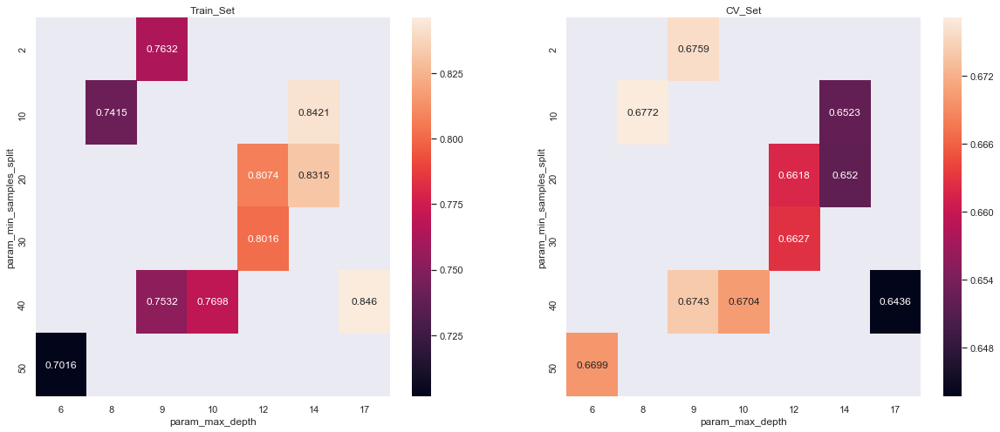

In [117]:
import seaborn as sns
sns.set()
df1=pd.DataFrame(clf.cv_results_).groupby(['param_min_samples_split', 'param_max_depth']).max().unstack()[['mean_test_score', 'mean_train_score']]
fig,ax=plt.subplots(1,2, figsize=(20,8))
sns.heatmap(df1.mean_train_score,annot=True, fmt='.4g', ax=ax[0])
sns.heatmap(df1.mean_test_score,annot=True, fmt='.4g', ax=ax[1])
ax[0].set_title("Train_Set")
ax[1].set_title("CV_Set")
plt.show()

In [118]:
print(clf.best_estimator_)

print(clf.score(X_tr_1,y_train))
print(clf.score(X_cv_1,y_cv))

DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=8,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=10,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')
0.7299606135901543
0.6829400084465046


### Testing on Test Data(using our max_depth=8 and min_sapmle_split=10 ) 

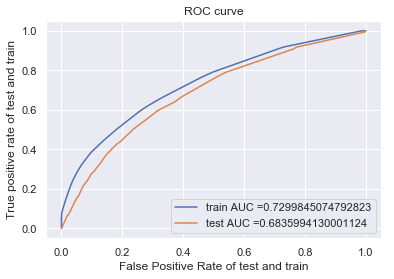

In [120]:
dt = DecisionTreeClassifier(max_depth=8, min_samples_split=10,class_weight='balanced')
 
dt.fit(X_tr_1, y_train)
train_predict=dt.predict_proba(X_tr_1)[:,1]
test_predict= dt.predict_proba(X_te_1)[:,1]
train_fpr,train_tpr,train_thresholds= roc_curve(y_train,train_predict)
test_fpr,test_tpr,test_thresholds= roc_curve(y_test,test_predict)
plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr))) #documentation of auc-> https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))

plt.legend()
plt.xlabel("False Positive Rate of test and train") #plt.plot documentation ->https://matplotlib.org/3.1.0/tutorials/introductory/pyplot.html
plt.ylabel("True positive rate of test and train")
plt.title("ROC curve")
plt.grid(True)
plt.show()

### Confusion Matrix

In [121]:
df=pd.DataFrame({"fpr":train_fpr,"tpr":train_tpr,"threshold":train_thresholds})
print(df.head(3))
print(df.shape)

        fpr       tpr  threshold
0  0.000000  0.000000   2.000000
1  0.000000  0.051472   1.000000
2  0.000135  0.059498   0.983499
(75, 3)


In [122]:
df['Specificty']=1-df.fpr

In [123]:
df['Value']=df.tpr*df.Specificty

In [124]:
df.sort_values("Value", axis = 0, ascending = False, 
                 inplace = True, na_position ='first') 

df.head(3)

,fpr,tpr,threshold,Specificty,Value
38,0.282656,0.619128,0.504663,0.717344,0.444128
39,0.316321,0.649381,0.473310,0.683679,0.443968
40,0.319688,0.652361,0.469521,0.680312,0.443809


In [125]:
index = df.Value.argmax()

In [126]:
a=df['threshold'][index]
print(a)

0.5046626223762413


In [127]:
from sklearn.preprocessing import binarize
y_predict_thres=binarize(train_predict.reshape(-1,1),a)#changing the threshold and printing the first value
print(y_predict_thres[0])

[1.]


In [128]:
from sklearn.metrics import confusion_matrix
print("Threshold",a)
print("confusion matrix")
cm=confusion_matrix(y_train, y_predict_thres)
print(cm)

Threshold 0.5046626223762413
confusion matrix
[[ 5475  1951]
 [16695 24920]]


Text(0.5, 39.5, 'Predicted')

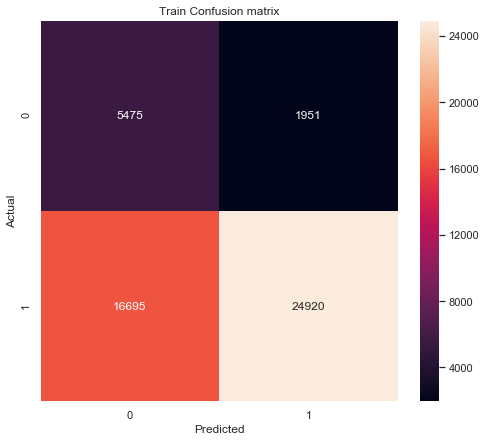

In [129]:
#https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix

import seaborn as sn
df_cm=pd.DataFrame(cm,index=[0,1],columns=[0,1])
plt.figure(figsize = (8,7))
plt.title("Train Confusion matrix")
ax=sn.heatmap(df_cm, annot=True,fmt='g')
ax.set_ylabel("Actual")
ax.set_xlabel("Predicted")

#### Test Data

In [130]:
from sklearn.preprocessing import binarize
y_predict_thres=binarize(test_predict.reshape(-1,1),a)#changing the threshold and printing the first value
print(y_predict_thres[0])

[1.]


In [131]:
from sklearn.metrics import confusion_matrix
print("Threshold",a)

print("Test confusion matrix")
cm1=confusion_matrix(y_test, y_predict_thres)
print(cm1)

Threshold 0.5046626223762413
Test confusion matrix
[[ 3750  1709]
 [12457 18136]]


Text(0.5, 39.5, 'Predicted')

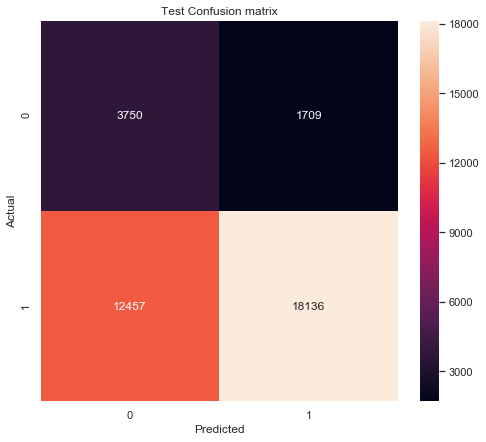

In [132]:
#https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix

import seaborn as sn
df_cm=pd.DataFrame(cm1,index=[0,1],columns=[0,1])
plt.figure(figsize = (8,7))
plt.title("Test Confusion matrix")
ax=sn.heatmap(df_cm, annot=True,fmt='g')
ax.set_ylabel("Actual")
ax.set_xlabel("Predicted")

## Decision Tree

https://dataaspirant.com/2017/04/21/visualize-decision-tree-python-graphviz/

https://medium.com/@rnbrown/creating-and-visualizing-decision-trees-with-python-f8e8fa394176

In [134]:
feat1=vectorizer_cat.get_feature_names()
print(len(feat1))

9


In [135]:
feat2=vectorizer_sub_cat.get_feature_names()
print(len(feat2))

30


In [136]:
feat3=vectorizer_school.get_feature_names()
print(len(feat3))

51


In [137]:
feat4=vectorizer_grade.get_feature_names()
print(len(feat4))

4


In [138]:
feat5=vectorizer_prefix.get_feature_names()
print(len(feat5))

6


In [139]:
feat6_bw=model_essay_bow.get_feature_names()
print(len(feat6_bw))

12015


In [140]:
feat7_bw=model_title_bow.get_feature_names()
print(len(feat7_bw))

2010


In [148]:
feat8=["price"]
feat9=["quantity"]
feat10=["teacher_number_of_previously_posted_projects"]

In [149]:
total_features_bow=feat1+feat2+feat3+feat4+feat5+feat6+feat7+feat8+feat9+feat10

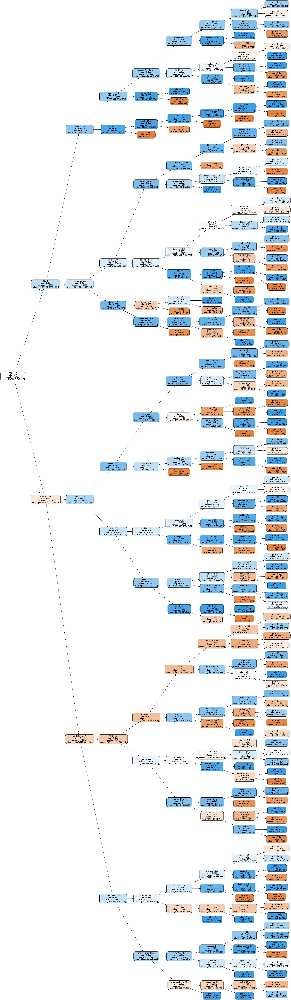

In [153]:
import warnings
warnings.filterwarnings("ignore")
from sklearn.externals.six import StringIO
from IPython.display import Image
from sklearn.tree import export_graphviz
import pydotplus


dot_data=StringIO()
export_graphviz(dt, out_file=dot_data, filled=True , rounded=True, special_characters=True , feature_names=total_features_bow, rotate=True)
graph=pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

## False Positive

In [154]:
y_pred_class=y_predict_thres.ravel()

In [155]:
print(X_test[(y_pred_class==1) & (y_test==0)].columns)

Index(['Unnamed: 0', 'school_state',
       'teacher_number_of_previously_posted_projects', 'price', 'quantity',
       'clean_categories', 'clean_subcategories', 'preprocessed_essays',
       'preprocessed_title', 'preprocessed_prefix', 'preprocessed_grade',
       'preprocessed_resource'],
      dtype='object')


In [156]:
#false positive
false_pos_essay=X_test.preprocessed_essays[(y_pred_class==1) & (y_test==0)]

In [157]:
#print(false_pos_essay)
print(type(false_pos_essay))

<class 'pandas.core.series.Series'>


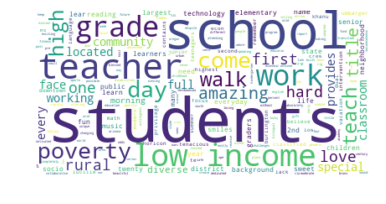

In [158]:
from wordcloud import WordCloud



#https://www.mikulskibartosz.name/word-cloud-from-a-pandas-data-frame/
#https://www.datacamp.com/community/tutorials/wordcloud-python
#create and generate wordcloud
wordcloud = WordCloud(background_color="white").generate(str(false_pos_essay))

#display the wordcloud
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

Words like <span class="mark">Students, teacher, school, poverty</span> are recognized as False Positive

{'whiskers': [<matplotlib.lines.Line2D at 0x1c68d8a2f28>,
 'caps': [<matplotlib.lines.Line2D at 0x1c68d8a7668>,
 'boxes': [<matplotlib.lines.Line2D at 0x1c68d8a2b00>],
 'medians': [<matplotlib.lines.Line2D at 0x1c68d8a7dd8>],
 'fliers': [<matplotlib.lines.Line2D at 0x1c68d8a7ef0>],
 'means': []}

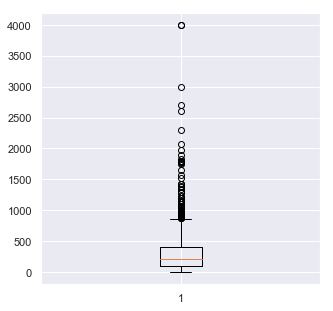

In [159]:
false_pos_price=X_test.price[(y_pred_class==1) & (y_test==0)]



plt.figure(figsize=(5,5))
plt.boxplot(false_pos_price)

Aveage price range of around <span class="mark">200</span> is false positive with <span class="mark">some outliers</span>

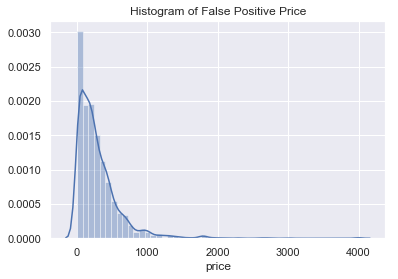

In [160]:
# Plot a histogram of the Price
sns.distplot(false_pos_price, kde = True).set_title("Histogram of False Positive Price")
plt.show()

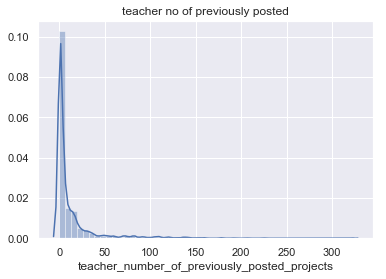

In [161]:
false_pos_tnp=X_test.teacher_number_of_previously_posted_projects[(y_pred_class==1) & (y_test==0)]

sns.distplot(false_pos_tnp, kde = True).set_title("teacher no of previously posted")
plt.show()

## Set 2: Categorical Features,Numerical Features+Preprocessed Essay(tf-idf)+Preprocessed Title(tf-idf)

In [163]:
from scipy.sparse import hstack

X_tr_2=hstack((categories_ohe_train,subcategories_ohe_train,state_ohe_train,grade_ohe_train,prefix_ohe_train,price_train,quantity_train,tnp_train,train_tfidf_title,train_tfidf_essay)).tocsr()

X_cv_2=hstack((categories_ohe_cv,subcategories_ohe_cv,state_ohe_cv,grade_ohe_cv,prefix_ohe_cv,price_cv,quantity_cv,tnp_cv,cv_tfidf_essay,cv_tfidf_title)).tocsr()

X_te_2=hstack((categories_ohe_test,subcategories_ohe_test,state_ohe_test,grade_ohe_test,prefix_ohe_test,price_test,quantity_test,tnp_test,test_tfidf_essay,test_tfidf_title)).tocsr()

In [164]:
#checking the final matrix are of same dimension or not
print(X_tr_2.shape,y_train.shape)
print("="*50)
print(X_cv_2.shape,y_cv.shape)
print("="*50)
print(X_te_2.shape,y_test.shape)

(49041, 14128) (49041,)
(24155, 14128) (24155,)
(36052, 14128) (36052,)


### finding best Hyperparameters using RandomizedSearchCV

In [165]:
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeClassifier
dt=DecisionTreeClassifier(class_weight='balanced')
parameters={'max_depth':[4,6,8,9,10,12,14,17], 'min_samples_split':[2,10,20,30,40,50]}

clf=RandomizedSearchCV(dt,parameters, cv=3, scoring='roc_auc', return_train_score=True)

set2=clf.fit(X_tr_2,y_train)

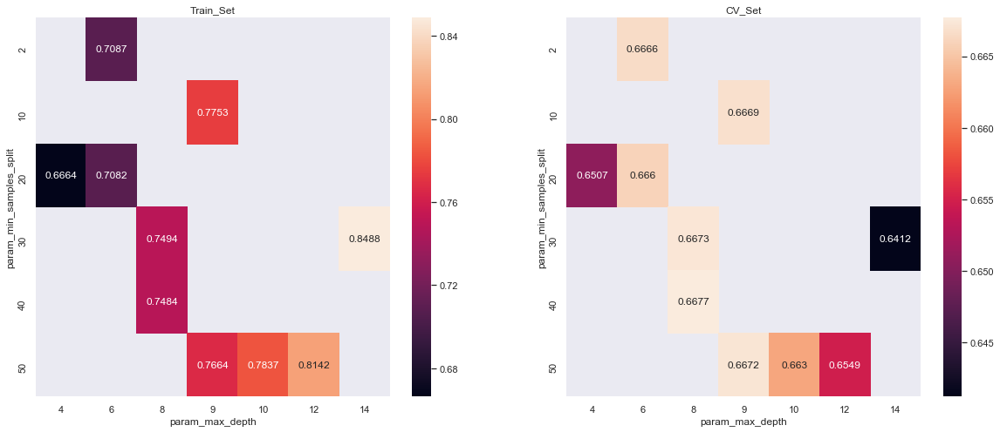

In [166]:
import seaborn as sns
sns.set()
df2=pd.DataFrame(clf.cv_results_).groupby(['param_min_samples_split', 'param_max_depth']).max().unstack()[['mean_test_score', 'mean_train_score']]
fig,ax=plt.subplots(1,2, figsize=(20,8))
sns.heatmap(df2.mean_train_score,annot=True, fmt='.4g', ax=ax[0])
sns.heatmap(df2.mean_test_score,annot=True, fmt='.4g', ax=ax[1])
ax[0].set_title("Train_Set")
ax[1].set_title("CV_Set")
plt.show()

In [168]:
print(clf.best_estimator_)

print(clf.score(X_tr_2,y_train))
print(clf.score(X_cv_2,y_cv))

DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=8,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=40,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')
0.7369880752860722
0.6425546748953517


### Testing on Test Data(using our max_depth=8 and min_sapmle_split=40 )

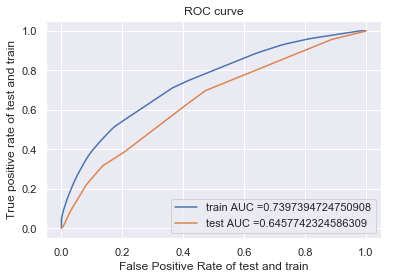

In [169]:
dt = DecisionTreeClassifier(max_depth=8, min_samples_split=10,class_weight='balanced')
 
dt.fit(X_tr_2, y_train)
train_predict=dt.predict_proba(X_tr_2)[:,1]
test_predict= dt.predict_proba(X_te_2)[:,1]
train_fpr,train_tpr,train_thresholds= roc_curve(y_train,train_predict)
test_fpr,test_tpr,test_thresholds= roc_curve(y_test,test_predict)
plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr))) #documentation of auc-> https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))

plt.legend()
plt.xlabel("False Positive Rate of test and train") #plt.plot documentation ->https://matplotlib.org/3.1.0/tutorials/introductory/pyplot.html
plt.ylabel("True positive rate of test and train")
plt.title("ROC curve")
plt.grid(True)
plt.show()

### Confusion Matrix

In [170]:
df=pd.DataFrame({"fpr":train_fpr,"tpr":train_tpr,"threshold":train_thresholds})
print(df.head(3))
print(df.shape)

        fpr       tpr  threshold
0  0.000000  0.000000    2.00000
1  0.000000  0.041139    1.00000
2  0.000539  0.050583    0.94604
(74, 3)


In [171]:
df['Specificty']=1-df.fpr

In [172]:
df['Value']=df.tpr*df.Specificty

In [173]:
df.sort_values("Value", axis = 0, ascending = False, 
                 inplace = True, na_position ='first') 

df.head(3)


,fpr,tpr,threshold,Specificty,Value
29,0.337328,0.682903,0.506639,0.662672,0.452540
30,0.365203,0.711258,0.504269,0.634797,0.451504
31,0.365742,0.711715,0.458762,0.634258,0.451411


In [174]:
index = df.Value.argmax()

In [175]:
a=df['threshold'][index]
print(a)

0.5066388551309041


In [176]:
from sklearn.preprocessing import binarize
y_predict_thres=binarize(train_predict.reshape(-1,1),a)#changing the threshold and printing the first value
print(y_predict_thres[0])

[1.]


In [177]:
from sklearn.metrics import confusion_matrix
print("Threshold",a)
print("confusion matrix")
cm=confusion_matrix(y_train, y_predict_thres)
print(cm)

Threshold 0.5066388551309041
confusion matrix
[[ 5863  1563]
 [18617 22998]]


Text(0.5, 39.5, 'Predicted')

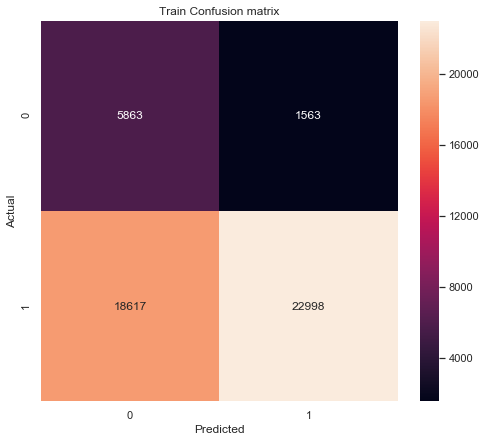

In [178]:
#https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix

import seaborn as sn
df_cm=pd.DataFrame(cm,index=[0,1],columns=[0,1])
plt.figure(figsize = (8,7))
plt.title("Train Confusion matrix")
ax=sn.heatmap(df_cm, annot=True,fmt='g')
ax.set_ylabel("Actual")
ax.set_xlabel("Predicted")

#### Test Data

In [179]:
from sklearn.preprocessing import binarize
y_predict_thres=binarize(test_predict.reshape(-1,1),a)#changing the threshold and printing the first value
print(y_predict_thres[0])

[1.]


In [180]:
from sklearn.metrics import confusion_matrix
print("Threshold",a)

print("Test confusion matrix")
cm1=confusion_matrix(y_test, y_predict_thres)
print(cm1)


Threshold 0.5066388551309041
Test confusion matrix
[[ 4330  1129]
 [18758 11835]]


Text(0.5, 39.5, 'Predicted')

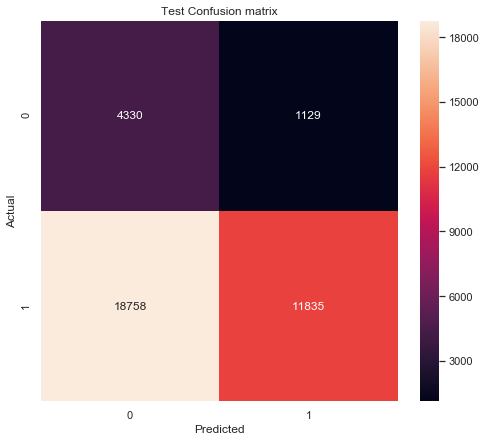

In [181]:
#https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix

import seaborn as sn
df_cm=pd.DataFrame(cm1,index=[0,1],columns=[0,1])
plt.figure(figsize = (8,7))
plt.title("Test Confusion matrix")
ax=sn.heatmap(df_cm, annot=True,fmt='g')
ax.set_ylabel("Actual")
ax.set_xlabel("Predicted")

## Decision Tree

In [183]:
feat6_tf=model_essay_tfidf.get_feature_names()

In [184]:
feat7_tf=model_title_tfidf.get_feature_names()

In [185]:
total_features_tfidf=feat1+feat2+feat3+feat4+feat5+feat6_tf+feat7_tf+feat8+feat9+feat10

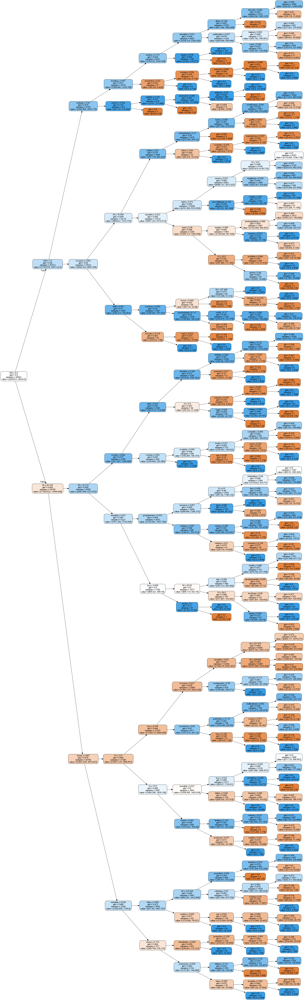

In [186]:
import warnings
warnings.filterwarnings("ignore")
from sklearn.externals.six import StringIO
from IPython.display import Image
from sklearn.tree import export_graphviz
import pydotplus


dot_data=StringIO()
export_graphviz(dt, out_file=dot_data, filled=True , rounded=True, special_characters=True , feature_names=total_features_tfidf, rotate=True)
graph=pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

## False Positive

In [187]:
y_pred_class=y_predict_thres.ravel()

In [188]:
print(X_test[(y_pred_class==1) & (y_test==0)].columns)

Index(['Unnamed: 0', 'school_state',
       'teacher_number_of_previously_posted_projects', 'price', 'quantity',
       'clean_categories', 'clean_subcategories', 'preprocessed_essays',
       'preprocessed_title', 'preprocessed_prefix', 'preprocessed_grade',
       'preprocessed_resource'],
      dtype='object')


In [189]:
#false positive
false_pos_essay=X_test.preprocessed_essays[(y_pred_class==1) & (y_test==0)]
#print(false_pos_essay)
print(type(false_pos_essay))

<class 'pandas.core.series.Series'>


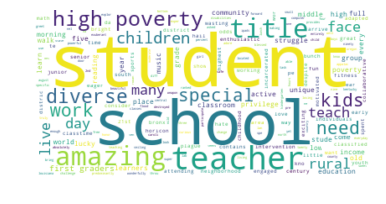

In [190]:
from wordcloud import WordCloud



#https://www.mikulskibartosz.name/word-cloud-from-a-pandas-data-frame/
#https://www.datacamp.com/community/tutorials/wordcloud-python
#create and generate wordcloud
wordcloud = WordCloud(background_color="white").generate(str(false_pos_essay))

#display the wordcloud
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

WOrds like <span class="mark">students,teacher,schools ,work</span> are recognized as False Positive

In [191]:
false_pos_price=X_test.price[(y_pred_class==1) & (y_test==0)]

{'whiskers': [<matplotlib.lines.Line2D at 0x1c68c855dd8>,
 'caps': [<matplotlib.lines.Line2D at 0x1c68c8688d0>,
 'boxes': [<matplotlib.lines.Line2D at 0x1c68c855c50>],
 'medians': [<matplotlib.lines.Line2D at 0x1c68c868fd0>],
 'fliers': [<matplotlib.lines.Line2D at 0x1c68c868048>],
 'means': []}

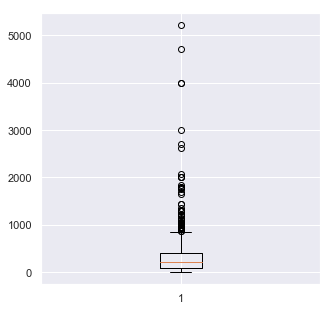

In [192]:
plt.figure(figsize=(5,5))
plt.boxplot(false_pos_price)

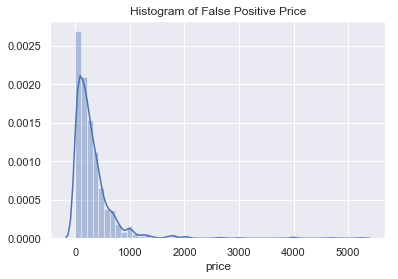

In [193]:
# Plot a histogram of the price
sns.distplot(false_pos_price, kde = True).set_title("Histogram of False Positive Price")
plt.show()


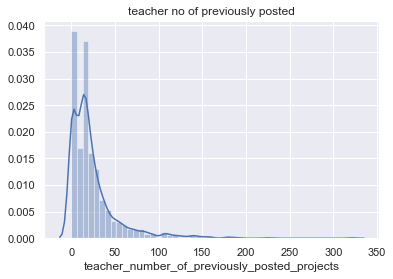

In [194]:
false_pos_tnp=X_test.teacher_number_of_previously_posted_projects[(y_pred_class==1) & (y_test==0)]


sns.distplot(false_pos_tnp, kde = True).set_title("teacher no of previously posted")
plt.show()

## Set 3: Categorical Features,Numerical Features+Preprocessed Essay(Avg W2V)+Preprocessed Title(Avg W2V)

In [195]:
X_tr_3=hstack((categories_ohe_train,subcategories_ohe_train,state_ohe_train,grade_ohe_train,prefix_ohe_train,price_train,quantity_train,tnp_train,avg_w2v_vectors_train,avg_w2v_vectors_title_train)).tocsr()

X_cv_3=hstack((categories_ohe_cv,subcategories_ohe_cv,state_ohe_cv,grade_ohe_cv,prefix_ohe_cv,price_cv,quantity_cv,tnp_cv,avg_w2v_vectors_cv,avg_w2v_vectors_title_cv)).tocsr()

X_te_3=hstack((categories_ohe_test,subcategories_ohe_test,state_ohe_test,grade_ohe_test,prefix_ohe_test,price_test,quantity_test,tnp_test,avg_w2v_vectors_test,avg_w2v_vectors_title_test)).tocsr()

In [196]:
#checking the final matrix are of same dimension or not
print(X_tr_3.shape,y_train.shape)
print("="*50)
print(X_cv_3.shape,y_cv.shape)
print("="*50)
print(X_te_3.shape,y_test.shape)

(49041, 703) (49041,)
(24155, 703) (24155,)
(36052, 703) (36052,)


### finding best Hyperparameters using RandomizedSearchCV

In [197]:
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeClassifier
dt=DecisionTreeClassifier(class_weight='balanced')
parameters={'max_depth':[4,6,8,9,10,12,14,17], 'min_samples_split':[2,10,20,30,40,50]}

clf=RandomizedSearchCV(dt,parameters, cv=3, scoring='roc_auc', return_train_score=True)

set3=clf.fit(X_tr_3,y_train)

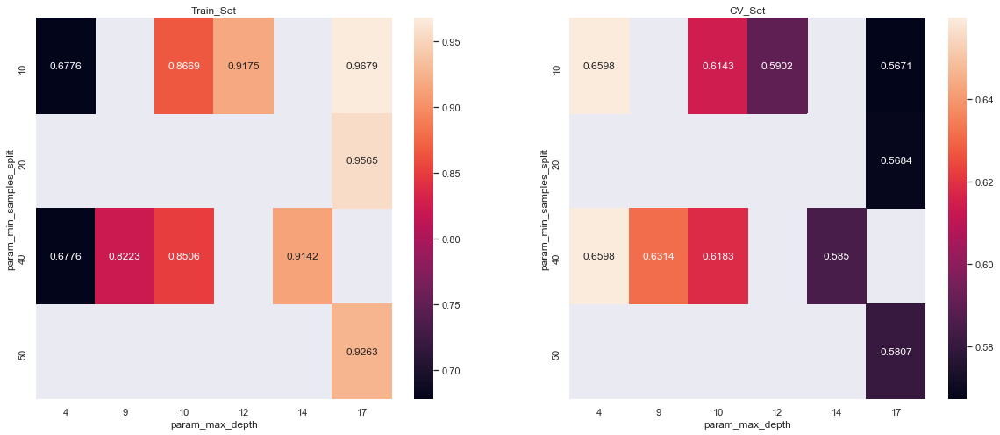

In [198]:
import seaborn as sns
sns.set()
df3=pd.DataFrame(clf.cv_results_).groupby(['param_min_samples_split', 'param_max_depth']).max().unstack()[['mean_test_score', 'mean_train_score']]
fig,ax=plt.subplots(1,2, figsize=(20,8))
sns.heatmap(df3.mean_train_score,annot=True, fmt='.4g', ax=ax[0])
sns.heatmap(df3.mean_test_score,annot=True, fmt='.4g', ax=ax[1])
ax[0].set_title("Train_Set")
ax[1].set_title("CV_Set")
plt.show()

In [199]:
print(clf.best_estimator_)

print(clf.score(X_tr_3,y_train))
print(clf.score(X_cv_3,y_cv))

DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=4,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=10,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')
0.6766787859768629
0.6712575492068655


### Testing on Test Data(using our max_depth=4 and min_sapmle_split=10 ) 


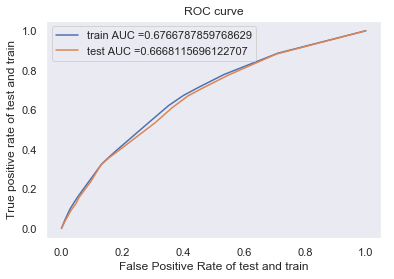

In [200]:
dt = DecisionTreeClassifier(max_depth=4, min_samples_split=10,class_weight='balanced')
 
dt.fit(X_tr_3, y_train)
train_predict=dt.predict_proba(X_tr_3)[:,1]
test_predict= dt.predict_proba(X_te_3)[:,1]
train_fpr,train_tpr,train_thresholds= roc_curve(y_train,train_predict)
test_fpr,test_tpr,test_thresholds= roc_curve(y_test,test_predict)
plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr))) #documentation of auc-> https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))

plt.legend()
plt.xlabel("False Positive Rate of test and train") #plt.plot documentation ->https://matplotlib.org/3.1.0/tutorials/introductory/pyplot.html
plt.ylabel("True positive rate of test and train")
plt.title("ROC curve")
plt.grid(True)
plt.show()

### Confusion Matrix

In [201]:
df=pd.DataFrame({"fpr":train_fpr,"tpr":train_tpr,"threshold":train_thresholds})
print(df.head(3))
print(df.shape)

        fpr       tpr  threshold
0  0.000000  0.000000   1.790795
1  0.011042  0.041740   0.790795
2  0.027740  0.097201   0.768593
(17, 3)


In [202]:
df['Specificty']=1-df.fpr

In [203]:
df['Value']=df.tpr*df.Specificty

In [204]:
df.sort_values("Value", axis = 0, ascending = False, 
                 inplace = True, na_position ='first') 

df.head(3)

,fpr,tpr,threshold,Specificty,Value
11,0.398734,0.670696,0.513230,0.601266,0.403266
10,0.351602,0.621002,0.568454,0.648398,0.402656
12,0.404794,0.675982,0.465926,0.595206,0.402349


In [205]:
index = df.Value.argmax()

In [206]:
a=df['threshold'][index]
print(a)

0.5132296008270552


In [207]:
from sklearn.preprocessing import binarize
y_predict_thres=binarize(train_predict.reshape(-1,1),a)#changing the threshold and printing the first value
print(y_predict_thres[0])


[1.]


In [208]:
from sklearn.metrics import confusion_matrix
print("Threshold",a)
print("confusion matrix")
cm=confusion_matrix(y_train, y_predict_thres)
print(cm)


Threshold 0.5132296008270552
confusion matrix
[[ 4815  2611]
 [15772 25843]]


Text(0.5, 39.5, 'Predicted')

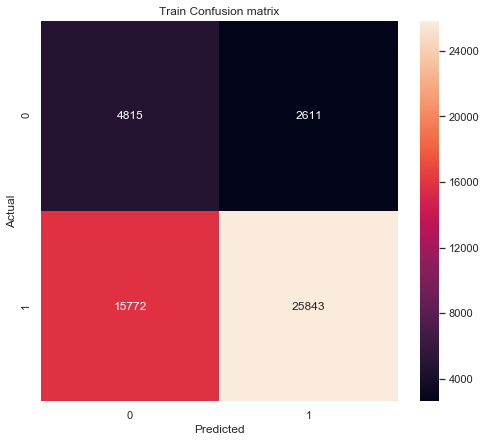

In [209]:
#https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix

import seaborn as sn
df_cm=pd.DataFrame(cm,index=[0,1],columns=[0,1])
plt.figure(figsize = (8,7))
plt.title("Train Confusion matrix")
ax=sn.heatmap(df_cm, annot=True,fmt='g')
ax.set_ylabel("Actual")
ax.set_xlabel("Predicted")

#### Test Data

In [210]:
from sklearn.preprocessing import binarize
y_predict_thres=binarize(test_predict.reshape(-1,1),a)#changing the threshold and printing the first value
print(y_predict_thres[0])

[1.]


In [211]:
from sklearn.metrics import confusion_matrix
print("Threshold",a)

print("Test confusion matrix")
cm1=confusion_matrix(y_test, y_predict_thres)
print(cm1)

Threshold 0.5132296008270552
Test confusion matrix
[[ 3475  1984]
 [11915 18678]]


Text(0.5, 39.5, 'Predicted')

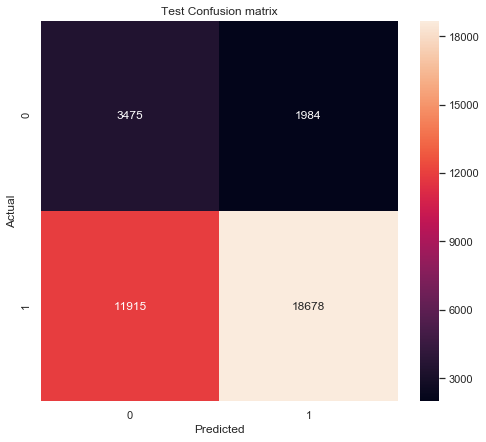

In [212]:
#https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix

import seaborn as sn
df_cm=pd.DataFrame(cm1,index=[0,1],columns=[0,1])
plt.figure(figsize = (8,7))
plt.title("Test Confusion matrix")
ax=sn.heatmap(df_cm, annot=True,fmt='g')
ax.set_ylabel("Actual")
ax.set_xlabel("Predicted")

## False Positive

In [213]:
y_pred_class=y_predict_thres.ravel()

In [214]:
print(X_test[(y_pred_class==1) & (y_test==0)].columns)

Index(['Unnamed: 0', 'school_state',
       'teacher_number_of_previously_posted_projects', 'price', 'quantity',
       'clean_categories', 'clean_subcategories', 'preprocessed_essays',
       'preprocessed_title', 'preprocessed_prefix', 'preprocessed_grade',
       'preprocessed_resource'],
      dtype='object')


In [215]:
#false positive
false_pos_essay=X_test.preprocessed_essays[(y_pred_class==1) & (y_test==0)]


#print(false_pos_essay)
print(type(false_pos_essay))

<class 'pandas.core.series.Series'>


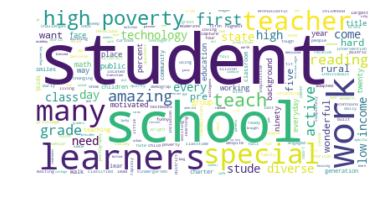

In [216]:
from wordcloud import WordCloud



#https://www.mikulskibartosz.name/word-cloud-from-a-pandas-data-frame/
#https://www.datacamp.com/community/tutorials/wordcloud-python
#create and generate wordcloud
wordcloud = WordCloud(background_color="white").generate(str(false_pos_essay))

#display the wordcloud
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

Words like <span class="mark">student, school, teacher</span> are categorized as False Positive 

In [217]:
false_pos_price=X_test.price[(y_pred_class==1) & (y_test==0)]

{'whiskers': [<matplotlib.lines.Line2D at 0x1c68c937358>,
 'caps': [<matplotlib.lines.Line2D at 0x1c68c9786a0>,
 'boxes': [<matplotlib.lines.Line2D at 0x1c68c9377f0>],
 'medians': [<matplotlib.lines.Line2D at 0x1c68c86e240>],
 'fliers': [<matplotlib.lines.Line2D at 0x1c68c978c18>],
 'means': []}

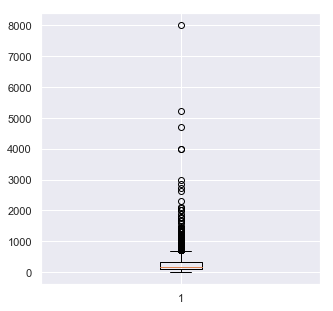

In [218]:
plt.figure(figsize=(5,5))
plt.boxplot(false_pos_price)

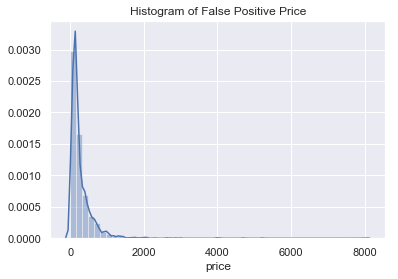

In [219]:
# Plot a histogram of the price
sns.distplot(false_pos_price, kde = True).set_title("Histogram of False Positive Price")
plt.show()

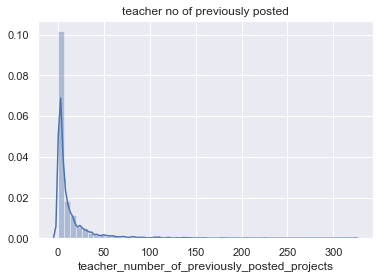

In [296]:
false_pos_tnp=X_test.teacher_number_of_previously_posted_projects[(y_pred_class==1) & (y_test==0)]


sns.distplot(false_pos_tnp, kde = True).set_title("teacher no of previously posted")
plt.show()

## Set 4: Categorical Features,Numerical Features+Preprocessed Essay(TFIDF-W2V)+Preprocessed Title(TFIDF- W2V)

In [220]:
X_tr_4=hstack((categories_ohe_train,subcategories_ohe_train,state_ohe_train,grade_ohe_train,prefix_ohe_train,price_train,quantity_train,tnp_train,tfidf_w2v_vectors_train,tfidf_w2v_vectors_title_train)).tocsr()

X_cv_4=hstack((categories_ohe_cv,subcategories_ohe_cv,state_ohe_cv,grade_ohe_cv,prefix_ohe_cv,price_cv,quantity_cv,tnp_cv,tfidf_w2v_vectors_cv,tfidf_w2v_vectors_title_cv)).tocsr()

X_te_4=hstack((categories_ohe_test,subcategories_ohe_test,state_ohe_test,grade_ohe_test,prefix_ohe_test,price_test,quantity_test,tnp_test,tfidf_w2v_vectors_test,tfidf_w2v_vectors_title_test)).tocsr()

In [221]:
#checking the final matrix are of same dimension or not
print(X_tr_4.shape,y_train.shape)
print("="*50)
print(X_cv_4.shape,y_cv.shape)
print("="*50)
print(X_te_4.shape,y_test.shape)

(49041, 703) (49041,)
(24155, 703) (24155,)
(36052, 703) (36052,)


### finding best Hyperparameters using RandomizedSearchCV

In [224]:
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeClassifier
dt=DecisionTreeClassifier(class_weight='balanced')
parameters={'max_depth':[4,6,8,9,10,12,14,17], 'min_samples_split':[2,10,20,30,40,50]}

clf=RandomizedSearchCV(dt,parameters, cv=3, scoring='roc_auc', return_train_score=True)

set4=clf.fit(X_tr_4,y_train)

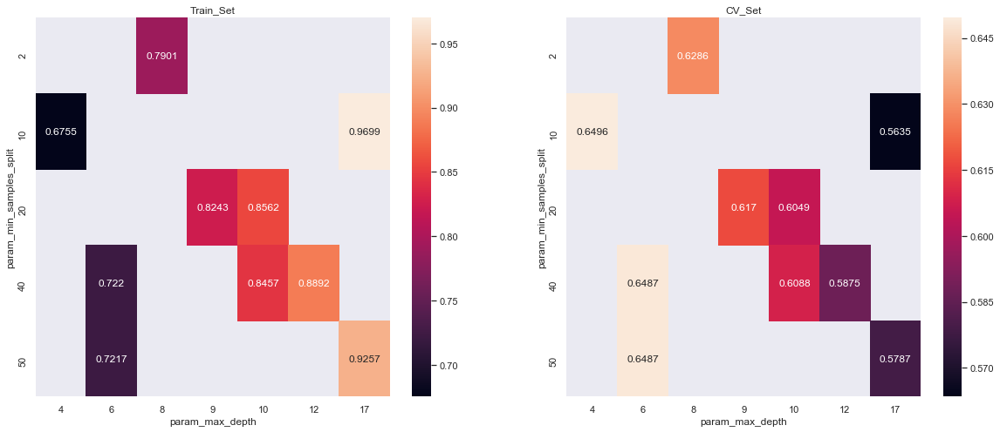

In [226]:
import seaborn as sns
sns.set()
df4=pd.DataFrame(clf.cv_results_).groupby(['param_min_samples_split', 'param_max_depth']).max().unstack()[['mean_test_score', 'mean_train_score']]
fig,ax=plt.subplots(1,2, figsize=(20,8))
sns.heatmap(df4.mean_train_score,annot=True, fmt='.4g', ax=ax[0])
sns.heatmap(df4.mean_test_score,annot=True, fmt='.4g', ax=ax[1])
ax[0].set_title("Train_Set")
ax[1].set_title("CV_Set")
plt.show()

In [227]:
print(clf.best_estimator_)

print(clf.score(X_tr_4,y_train))
print(clf.score(X_cv_4,y_cv))

DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=4,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=10,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')
0.6699778395827578
0.6635893340855092


### Testing on Test Data(using our max_depth=4 and min_sapmle_split=10 ) 

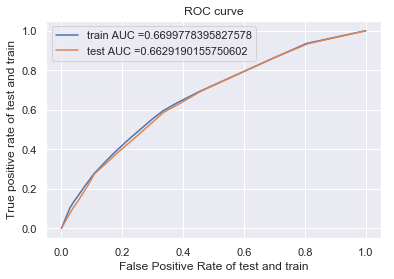

In [228]:
dt = DecisionTreeClassifier(max_depth=4, min_samples_split=10,class_weight='balanced')
 
dt.fit(X_tr_4, y_train)
train_predict=dt.predict_proba(X_tr_4)[:,1]
test_predict= dt.predict_proba(X_te_4)[:,1]
train_fpr,train_tpr,train_thresholds= roc_curve(y_train,train_predict)
test_fpr,test_tpr,test_thresholds= roc_curve(y_test,test_predict)
plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr))) #documentation of auc-> https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))

plt.legend()
plt.xlabel("False Positive Rate of test and train") #plt.plot documentation ->https://matplotlib.org/3.1.0/tutorials/introductory/pyplot.html
plt.ylabel("True positive rate of test and train")
plt.title("ROC curve")
plt.grid(True)
plt.show()

### Confusion Matrix

In [229]:
df=pd.DataFrame({"fpr":train_fpr,"tpr":train_tpr,"threshold":train_thresholds})
print(df.head(3))
print(df.shape)

        fpr       tpr  threshold
0  0.000000  0.000000   1.790284
1  0.013736  0.051760   0.790284
2  0.028548  0.105755   0.784722
(17, 3)


In [230]:
df['Specificty']=1-df.fpr

In [231]:
df['Value']=df.tpr*df.Specificty

In [232]:
df.sort_values("Value", axis = 0, ascending = False, 
                 inplace = True, na_position ='first') 

df.head(3)

,fpr,tpr,threshold,Specificty,Value
10,0.333019,0.594281,0.543401,0.666981,0.396374
11,0.378670,0.634242,0.466775,0.621330,0.394074
9,0.298815,0.553574,0.569895,0.701185,0.388158


In [233]:
index = df.Value.argmax()

In [234]:
a=df['threshold'][index]
print(a)

0.5434005760900228


In [235]:
from sklearn.preprocessing import binarize
y_predict_thres=binarize(train_predict.reshape(-1,1),a)#changing the threshold and printing the first value
print(y_predict_thres[0])

[1.]


In [236]:
from sklearn.metrics import confusion_matrix
print("Threshold",a)

print("confusion matrix")
cm=confusion_matrix(y_train, y_predict_thres)
print(cm)


Threshold 0.5434005760900228
confusion matrix
[[ 5207  2219]
 [18578 23037]]


Text(0.5, 39.5, 'Predicted')

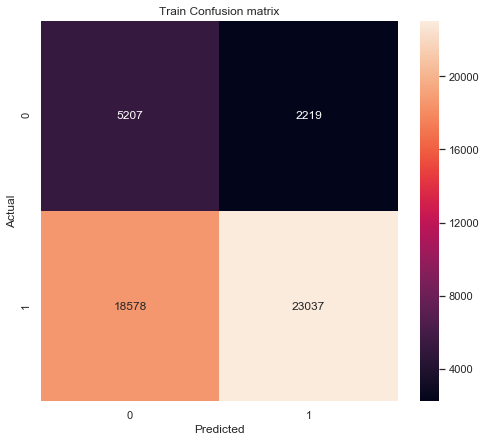

In [237]:
#https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix

import seaborn as sn
df_cm=pd.DataFrame(cm,index=[0,1],columns=[0,1])
plt.figure(figsize = (8,7))
plt.title("Train Confusion matrix")
ax=sn.heatmap(df_cm, annot=True,fmt='g')
ax.set_ylabel("Actual")
ax.set_xlabel("Predicted")


#### Test Data

In [238]:
from sklearn.preprocessing import binarize
y_predict_thres=binarize(test_predict.reshape(-1,1),a)#changing the threshold and printing the first value
print(y_predict_thres[0])

[1.]


In [239]:
from sklearn.metrics import confusion_matrix
print("Threshold",a)

print("Test confusion matrix")
cm1=confusion_matrix(y_test, y_predict_thres)
print(cm1)

Threshold 0.5434005760900228
Test confusion matrix
[[ 3796  1663]
 [13934 16659]]


Text(0.5, 39.5, 'Predicted')

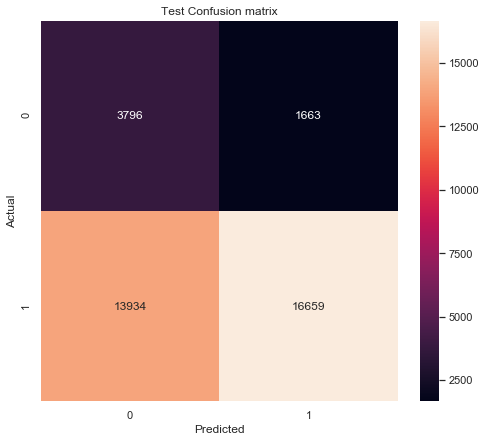

In [240]:
#https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix

import seaborn as sn
df_cm=pd.DataFrame(cm1,index=[0,1],columns=[0,1])
plt.figure(figsize = (8,7))
plt.title("Test Confusion matrix")
ax=sn.heatmap(df_cm, annot=True,fmt='g')
ax.set_ylabel("Actual")
ax.set_xlabel("Predicted")

In [241]:
y_pred_class=y_predict_thres.ravel()

In [242]:
print(X_test[(y_pred_class==1) & (y_test==0)].columns)

Index(['Unnamed: 0', 'school_state',
       'teacher_number_of_previously_posted_projects', 'price', 'quantity',
       'clean_categories', 'clean_subcategories', 'preprocessed_essays',
       'preprocessed_title', 'preprocessed_prefix', 'preprocessed_grade',
       'preprocessed_resource'],
      dtype='object')


In [243]:
#false positive
false_pos_essay=X_test.preprocessed_essays[(y_pred_class==1) & (y_test==0)]

In [244]:
#print(false_pos_essay)
print(type(false_pos_essay))

<class 'pandas.core.series.Series'>


In [245]:
from wordcloud import WordCloud

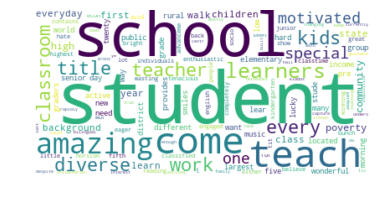

In [246]:
#https://www.mikulskibartosz.name/word-cloud-from-a-pandas-data-frame/
#https://www.datacamp.com/community/tutorials/wordcloud-python
#create and generate wordcloud
wordcloud = WordCloud(background_color="white").generate(str(false_pos_essay))

#display the wordcloud
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

<div class="mark">
Words like <span class="birk">school,students,low, income</span> are wrongly recognised as positive</div><i class="fa fa-lightbulb-o "></i>

In [247]:
false_pos_price=X_test.price[(y_pred_class==1) & (y_test==0)]

{'whiskers': [<matplotlib.lines.Line2D at 0x1c68c8e10b8>,
 'caps': [<matplotlib.lines.Line2D at 0x1c68c877a20>,
 'boxes': [<matplotlib.lines.Line2D at 0x1c68c8e1048>],
 'medians': [<matplotlib.lines.Line2D at 0x1c68c877400>],
 'fliers': [<matplotlib.lines.Line2D at 0x1c68d86d7b8>],
 'means': []}

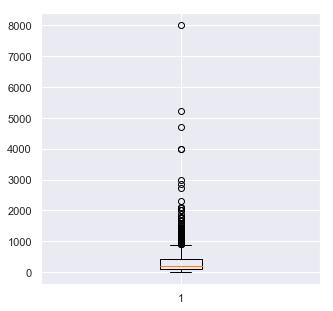

In [248]:
plt.figure(figsize=(5,5))
plt.boxplot(false_pos_price)

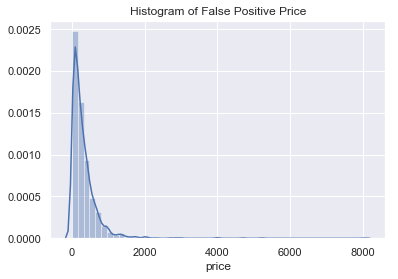

In [249]:
# Plot a histogram of the total bill
sns.distplot(false_pos_price, kde = True).set_title("Histogram of False Positive Price")
plt.show()

In [250]:
false_pos_tnp=X_test.teacher_number_of_previously_posted_projects[(y_pred_class==1) & (y_test==0)]

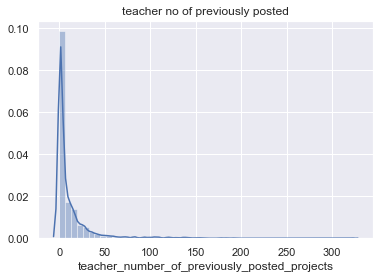

In [251]:
sns.distplot(false_pos_tnp, kde = True).set_title("teacher no of previously posted")
plt.show()

## Finding the top 5000 features of the set 2

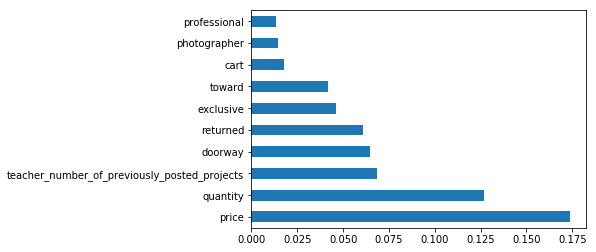

In [258]:
feat_importances = pd.Series(m, index=total_features_tfidf)
feat_importances.nlargest(10).plot(kind='barh')
plt.show()

In [253]:
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeClassifier
dt_5k=DecisionTreeClassifier(class_weight='balanced')
parameters={'max_depth':[4,6,8,9,10,12,14,17], 'min_samples_split':[2,10,20,30,40,50]}

clf_5k=RandomizedSearchCV(dt_5k,parameters, cv=3, scoring='roc_auc', return_train_score=True)

set_5k=clf_5k.fit(X_tr_2,y_train)

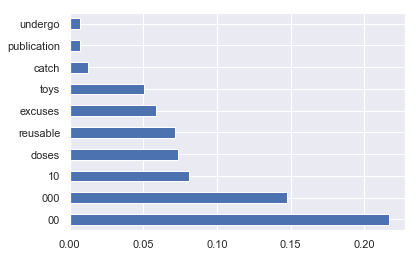

In [297]:
feat_importances = pd.Series(clf_5k.best_estimator_.feature_importances_, index=total_features_tfidf)
feat_importances.nlargest(10).plot(kind='barh')
plt.show()

In [256]:
X_tr_5k=X_tr_2[:,clf_5k.best_estimator_.feature_importances_.argsort()[::-1][:5000]]

print(X_tr_5k.shape)

(49041, 5000)


In [257]:
X_cv_5k=X_cv_2[:,clf_5k.best_estimator_.feature_importances_.argsort()[::-1][:5000]]

print(X_cv_5k.shape)

(24155, 5000)


In [258]:
X_te_5k=X_te_2[:,clf_5k.best_estimator_.feature_importances_.argsort()[::-1][:5000]]

print(X_te_5k.shape)

(36052, 5000)


## Training our Model with top 5000 features

100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [01:20<00:00, 20.23s/it]


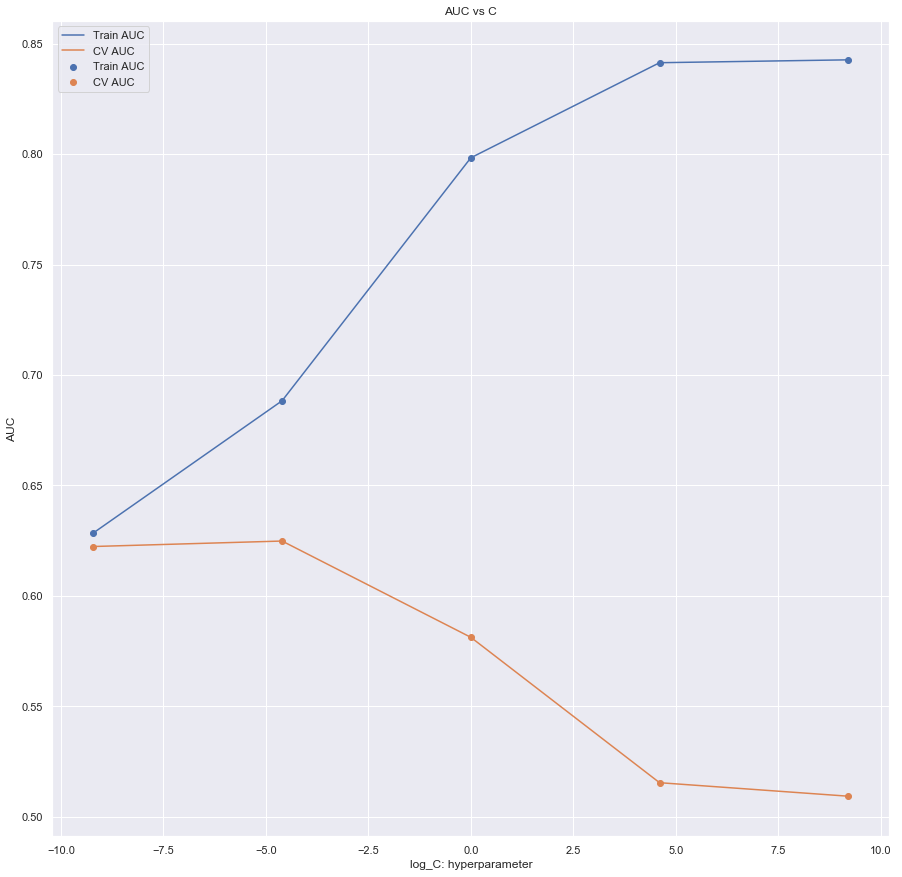

In [270]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score
import matplotlib.pyplot as plt
from tqdm import tqdm
import math
alpha1=[]
train_auc = []
cv_auc = []
C = [10**-4, 10**-2, 10**0, 10**2, 10**4]
for i in tqdm(C):
    logreg = LogisticRegression(C=i, class_weight='balanced') #to deal with class imbalance
    logreg.fit(X_tr_5k, y_train) #during fit our model is learning from the training data e.g. y=f(x)
    # roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
    # not the predicted outputs
    y_train_pred =  logreg.predict_log_proba(X_tr_5k)[:,1]
    y_cv_pred =  logreg.predict_log_proba(X_cv_5k)[:,1]
    train_auc.append(roc_auc_score(y_train,y_train_pred))#roc_auc_score->Compute(ROC AUC) from prediction scores.
    cv_auc.append(roc_auc_score(y_cv, y_cv_pred))  
  
for i in C:
    j=math.log(i)
    alpha1.append(j)
    
plt.figure(figsize=(15,15))
plt.plot(alpha1, train_auc, label='Train AUC') #Plotting K vs auc of train
plt.scatter(alpha1, train_auc, label='Train AUC') #Scatter plot of K vs auc train

plt.plot(alpha1, cv_auc, label='CV AUC') #Plotting K vs auc of train
plt.scatter(alpha1, cv_auc, label='CV AUC') #Scatter plot of K vs auc train

plt.legend() #adding legend
plt.xlabel("log_C: hyperparameter") #X axis-label
plt.ylabel("AUC")  #Y-axis label
plt.title("AUC vs C") #adding title of the plot
plt.grid(True)
plt.show()

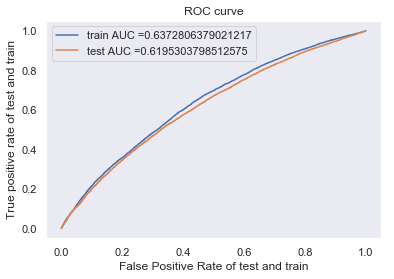

In [271]:
from sklearn.metrics import roc_curve,auc

logreg=LogisticRegression(penalty='l1',C=10**-2,class_weight='balanced')
logreg.fit(X_tr_5k,y_train)

#documentation of roc_curve ->https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html
#roc_curve returns three values fpr,tpr and thresholds
y_train_predict=logreg.predict_log_proba(X_tr_5k)[:,1]
y_test_predict=logreg.predict_log_proba(X_te_5k)[:,1]
train_fpr,train_tpr,train_thresholds= roc_curve(y_train,y_train_predict)
test_fpr,test_tpr,test_thresholds= roc_curve(y_test,y_test_predict)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr))) #documentation of auc-> https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))

plt.legend()
plt.xlabel("False Positive Rate of test and train") #plt.plot documentation ->https://matplotlib.org/3.1.0/tutorials/introductory/pyplot.html
plt.ylabel("True positive rate of test and train")
plt.title("ROC curve")
plt.grid()
plt.show(True)

## Confusion Matrix

In [272]:
df=pd.DataFrame({"fpr":train_fpr,"tpr":train_tpr,"threshold":train_thresholds})
print(df.head(3))
print(df.shape)

   fpr       tpr  threshold
0  0.0  0.000000   0.993176
1  0.0  0.000024  -0.006824
2  0.0  0.001226  -0.034185
(12485, 3)


In [273]:
df['Specificty']=1-df.fpr

In [274]:
df['Value']=df.tpr*df.Specificty

In [275]:
df.sort_values("Value", axis = 0, ascending = False, 
                 inplace = True, na_position ='first') 
df.head(3)

,fpr,tpr,threshold,Specificty,Value
5858,0.429437,0.634411,-0.700271,0.570563,0.361971
5878,0.431053,0.636189,-0.700816,0.568947,0.361958
5654,0.413951,0.617566,-0.694815,0.586049,0.361924


In [276]:
index = df.Value.argmax()
a=df['threshold'][index]
print(a)

-0.7002714206816614


In [277]:
from sklearn.preprocessing import binarize
y_predict_thres=binarize(y_train_predict.reshape(-1,1),a)#changing the threshold and printing the first value
print(y_predict_thres[0])

[1.]


In [278]:
from sklearn.metrics import confusion_matrix
print("Threshold",a)
print("Train confusion matrix")
cm=confusion_matrix(y_train, y_predict_thres)
print(cm)

Threshold -0.7002714206816614
Train confusion matrix
[[ 4237  3189]
 [15215 26400]]


Text(0.5, 39.5, 'Predicted')

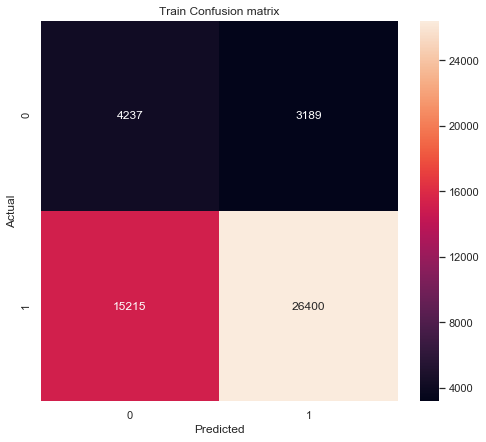

In [279]:
#https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix

import seaborn as sn
df_cm=pd.DataFrame(cm,index=[0,1],columns=[0,1])
plt.figure(figsize = (8,7))
plt.title("Train Confusion matrix")
ax=sn.heatmap(df_cm, annot=True,fmt='g')
ax.set_ylabel("Actual")
ax.set_xlabel("Predicted")

#### Test Data

In [280]:
from sklearn.preprocessing import binarize
y_predict_thres=binarize(y_test_predict.reshape(-1,1),a)#changing the threshold and printing the first value
print(y_predict_thres[0])

[0.]


In [281]:
from sklearn.metrics import confusion_matrix
print("Threshold",a)

print("Test confusion matrix")
cm1=confusion_matrix(y_test, y_predict_thres)
print(cm1)

Threshold -0.7002714206816614
Test confusion matrix
[[ 2769  2690]
 [10283 20310]]


Text(0.5, 39.5, 'Predicted')

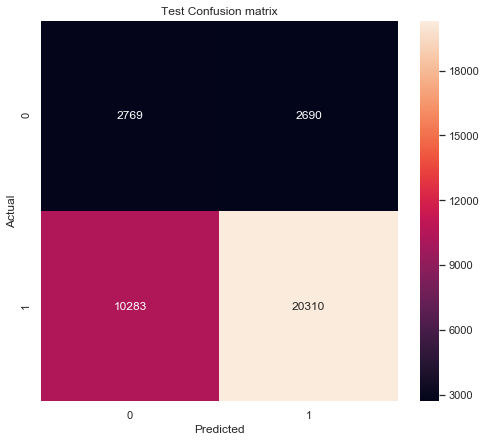

In [282]:
#https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix

import seaborn as sn
df_cm=pd.DataFrame(cm1,index=[0,1],columns=[0,1])
plt.figure(figsize = (8,7))
plt.title("Test Confusion matrix")
ax=sn.heatmap(df_cm, annot=True,fmt='g')
ax.set_ylabel("Actual")
ax.set_xlabel("Predicted")

## False Positive

In [283]:
y_pred_class=y_predict_thres.ravel()

In [284]:
print(X_test[(y_pred_class==1) & (y_test==0)].columns)

Index(['Unnamed: 0', 'school_state',
       'teacher_number_of_previously_posted_projects', 'price', 'quantity',
       'clean_categories', 'clean_subcategories', 'preprocessed_essays',
       'preprocessed_title', 'preprocessed_prefix', 'preprocessed_grade',
       'preprocessed_resource'],
      dtype='object')


In [285]:
#false positive
false_pos_essay=X_test.preprocessed_essays[(y_pred_class==1) & (y_test==0)]


#print(false_pos_essay)
print(type(false_pos_essay))

<class 'pandas.core.series.Series'>


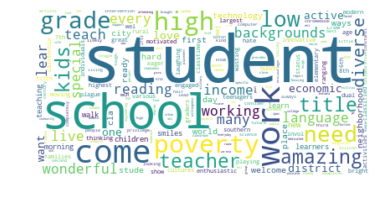

In [286]:
from wordcloud import WordCloud



#https://www.mikulskibartosz.name/word-cloud-from-a-pandas-data-frame/
#https://www.datacamp.com/community/tutorials/wordcloud-python
#create and generate wordcloud
wordcloud = WordCloud(background_color="white").generate(str(false_pos_essay))

#display the wordcloud
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [287]:
false_pos_price=X_test.price[(y_pred_class==1) & (y_test==0)]

{'whiskers': [<matplotlib.lines.Line2D at 0x1c68ca8c908>,
 'caps': [<matplotlib.lines.Line2D at 0x1c68ca8ce10>,
 'boxes': [<matplotlib.lines.Line2D at 0x1c68ca8c438>],
 'medians': [<matplotlib.lines.Line2D at 0x1c68ca8f828>],
 'fliers': [<matplotlib.lines.Line2D at 0x1c68ca8fba8>],
 'means': []}

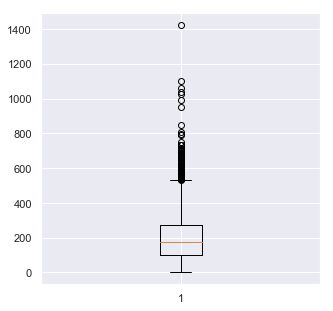

In [288]:
plt.figure(figsize=(5,5))
plt.boxplot(false_pos_price)

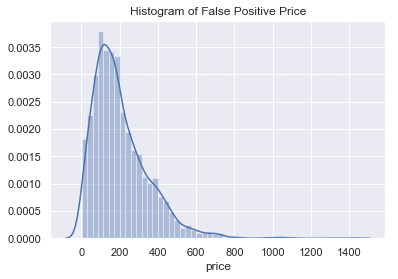

In [289]:
# Plot a histogram of the price
sns.distplot(false_pos_price, kde = True).set_title("Histogram of False Positive Price")
plt.show()

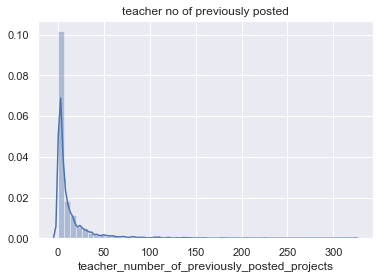

In [290]:
false_pos_tnp=X_test.teacher_number_of_previously_posted_projects[(y_pred_class==1) & (y_test==0)]


sns.distplot(false_pos_tnp, kde = True).set_title("teacher no of previously posted")
plt.show()

## Summarizing using Pretty Table

In [295]:
#Refer->http://zetcode.com/python/prettytable/
#Refer->https://het.as.utexas.edu/HET/Software/Numpy/reference/generated/numpy.percentile.html
#Refer->https://docs.scipy.org/doc/numpy-1.13.0/reference/generated/numpy.round_.html
from prettytable import PrettyTable
x=PrettyTable()

x.field_names=["SET","Vectorizer", "Model","Search-Param","Best Hyperparameter","Test AUC"] #column headers

x.add_row(["I", "BOW","Decision Tree" ,"Random Search", "max-depth=8,min_sample_split=10" , 0.683])
x.add_row(["II", "TFIDF","Decision Tree","Random Search", "max-depth=8,min_sample_split=40" , 0.645])
x.add_row(["III", "AVG W2V","Decision Tree","Random Search" ,"max-depth=4,min_sample_split=10", 0.666])
x.add_row(["IV", "TFIDF","Decision Tree","Random Search", "max-depth=4,min_sample_split=10" , 0.663])
x.add_row(["V", "Top 5K Features","Logistic Regression","Brute", "C=10**-2", 0.620])

print(x)

+-----+-----------------+---------------------+---------------+---------------------------------+----------+
| SET |    Vectorizer   |        Model        |  Search-Param |       Best Hyperparameter       | Test AUC |
+-----+-----------------+---------------------+---------------+---------------------------------+----------+
|  I  |       BOW       |    Decision Tree    | Random Search | max-depth=8,min_sample_split=10 |  0.683   |
|  II |      TFIDF      |    Decision Tree    | Random Search | max-depth=8,min_sample_split=40 |  0.645   |
| III |     AVG W2V     |    Decision Tree    | Random Search | max-depth=4,min_sample_split=10 |  0.666   |
|  IV |      TFIDF      |    Decision Tree    | Random Search | max-depth=4,min_sample_split=10 |  0.663   |
|  V  | Top 5K Features | Logistic Regression |     Brute     |             C=10**-2            |   0.62   |
+-----+-----------------+---------------------+---------------+---------------------------------+----------+
